# Project 1: Sex Differences in brain organization

### Main Script: FUNCTION

## Load packages

In [1]:
# General
import os
import sys
import numpy as np
import pandas as pd
import csv
import math
from math import isnan
import statistics
import pingouin as pg
import pickle

# Computing
import scipy.io  # loadmat
from scipy import stats
import sklearn 
from brainstat.stats.terms import FixedEffect
from brainstat.stats.SLM import SLM

# Visualisation
import matplotlib.pyplot as plt 
import seaborn as sns
import vtk
from IPython.display import display
import matplotlib.collections as clt
import ptitprince as pt

# Neuroimaging
import nibabel
import nilearn
from brainstat.datasets import fetch_parcellation
from enigmatoolbox.permutation_testing import spin_test, shuf_test

# Gradients
import brainspace
from brainspace.datasets import load_parcellation, load_conte69
from brainspace.plotting import plot_hemispheres
from brainspace.gradient import GradientMaps
from brainspace.utils.parcellation import map_to_labels

## Define directories

In [2]:
codedir = os.path.abspath('')  # obtain current direction from which script is runnning

datadir = '/data/p_02667/sex_diff_gradients/data/'

resdir_gsp = '/data/p_02667/sex_diff_gradients/results/GSP/'
resdir_hcp = '/data/p_02667/sex_diff_gradients/results/HCP/'
resdir_fig = '/data/p_02667/sex_diff_gradients/results/figures/'

## Import functions

In [3]:
%run p1_myfunctions.ipynb

# Data 

## Import the Yeo 7 network coding for the Schaefer 400 parcellation scheme 

(i.e., which network each parcel belongs to)



- **So a parcel cannot belong to more than 1 network..? LIMITATION NO? -> Yes. Shanmugan et al. (2022) for example use loading onto a network (i.e., not discrete)** 

In [4]:
# labels: 1=visual, 2=sensory motor, 3=dorsal attention, 4=ventral attention, 5=limbic, 6=fronto parietal, 7= DMN

with open(datadir+'yeo_7.csv') as f:
    reader = csv.reader(f)
    yeo7_networks = list(reader)[0]  # need [0] because the network values are contained in double brackets [[ ]]

Plotting the 7 Yeo networks on cortical surface

**TO DO:**
- no option of a map with 7 colors..? https://matplotlib.org/stable/tutorials/colors/colormaps.html
- there must be a better way of labelling the maps with actual names of networks (ie categorical)? maybe not, not the purpose of this plot hemispheres function


/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


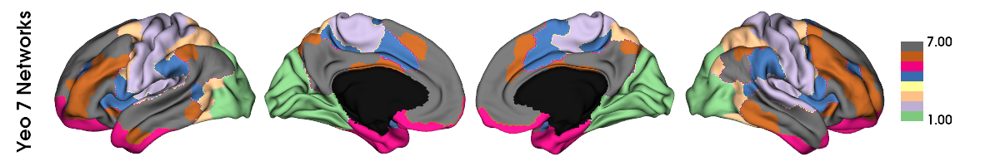

In [5]:
# need the the yeo network values (=dummy coding) to be in array format & float type in order to map_to_labels
yeo7_networks_array = []

for i in yeo7_networks:
    yeo7_networks_array.append(float(i))

yeo7_networks_array = np.asarray(yeo7_networks_array)



# defining labeling scheme and mask
labeling = load_parcellation('schaefer', scale=400, join=True)
surf_lh, surf_rh = load_conte69()

mask = labeling != 0

networks = map_to_labels(yeo7_networks_array, labeling, mask=mask, fill=np.nan)  # mean_grad contains 10 .gradients_ (1 gradient per column) - here I take all rows and individual select column based on gradient I want (first 3)

plot_hemispheres(surf_lh, surf_rh, array_name=networks, embed_nb = True, size=(1200, 200), cmap='Accent', color_bar=True, label_text=['Yeo 7 Networks'], zoom=1.55)


## Network labels ('Accent' cmap):
# 1 visual (green)
# 2 sensory motor (purple)
# 3 dorsal attention (beige)
# 4 ventral attention (blue)
# 5 limbic (fuchsia)
# 6 fronto parietal (brown)
# 7 DMN (grey)

This palette is to be used for every time that Yeo networks are displayed in color (except (a) for showing the networks plotted on the hemispheres - this dictionary doesn't work as cmap for plot_hemispheres; (b) the pie charts - dictionary format not recognized)

In [6]:
# original Yeo network colors
palette_labeled_networks = {'DMN': 'indianred',  
                            'dorsal attention' : 'forestgreen',  
                            'fronto parietal' : 'orange',  
                            'limbic' : 'lemonchiffon',  
                            'sensory motor' : 'steelblue',
                            'ventral attention' : 'orchid', 
                            'visual' : 'darkorchid'} 

This is not needed for the raincloud plot, just for the scatterplot G1 v G2 displaying networks

In [7]:
# making an array with yeo network labels (names instead of numbers)
yeo7_networks_array_labels = []

for i in yeo7_networks:
    if i == '1':
        yeo7_networks_array_labels.append('visual')
    elif i == '2':
        yeo7_networks_array_labels.append('sensory motor')
    elif i == '3':
        yeo7_networks_array_labels.append('dorsal attention')
    elif i == '4':
        yeo7_networks_array_labels.append('ventral attention')
    elif i == '5':
        yeo7_networks_array_labels.append('limbic')
    elif i == '6':
        yeo7_networks_array_labels.append('fronto parietal')
    elif i == '7':
        yeo7_networks_array_labels.append('DMN')

yeo7_networks_array_labels = np.asarray(yeo7_networks_array_labels)

In [8]:
network_names = ["visual", "sensory motor", "DMN", "dorsal attention", "ventral attention", "limbic", "fronto parietal"]

print("Number of parcels in each Yeo network:")
for i in range(len(network_names)):
    print(f"- {network_names[i]}: {yeo7_networks_array_labels.tolist().count(network_names[i])}")

Number of parcels in each Yeo network:
- visual: 61
- sensory motor: 77
- DMN: 90
- dorsal attention: 46
- ventral attention: 47
- limbic: 26
- fronto parietal: 53


## Fetch fsaverage parcellation (20484 vertices) coded for Schaefer 400 parcels - for Spin permutation tests

Spin permutation testing: https://enigma-toolbox.readthedocs.io/en/latest/pages/08.spintest/index.html -> requires data to be in fsaverage surface (not feasible with Schaefer parcellation)

**NOTE: schaefer_400_fs5 == 0 corresponds to midline (labels go from 0-400) -> disregard 0 in calculations and plotting**

In [9]:
# fetch the fsaverage parcellation labeling each of fsaverage5's 20484 vertices with its corresponding Schaefer parcel
schaefer_400_fs5 = fetch_parcellation("fsaverage5", "schaefer", 400)

## Functional connectivity matrices (parcellation scheme: Schaefer 400, 7 networks) z-transformed

In [ ]:
# define the path containing the functional connectivity matrices
GSP_path_fc_matrices = datadir+'fc_matrices/GSP/functional_schaefer400/'

# fetch the functional connectivity matrices of all subjects 
GSP_all_sub_fc_matrices = fetch_all_sub_conn_matrices(GSP_path_fc_matrices)

# store the functional connectivity matrices and subject list in respecive variables
GSP_fc_matrices = GSP_all_sub_fc_matrices['conn_matrices']
GSP_sub_list = GSP_all_sub_fc_matrices['sub_list']

In [ ]:
# define the path containing the functional connectivity matrices
HCP_path_fc_matrices = datadir+'fc_matrices/HCP/functional_schaefer400/mean/'

# fetch the functional connectivity matrices of all subjects 
HCP_all_sub_fc_matrices = fetch_all_sub_conn_matrices(HCP_path_fc_matrices)

# store the functional connectivity matrices and subject list in respecive variables
HCP_fc_matrices = HCP_all_sub_fc_matrices['conn_matrices']
HCP_sub_list = HCP_all_sub_fc_matrices['sub_list']

### Export subject lists, i.e., lists of subjects with functional connectivity matrices (to make available for p1_main_structure script)

In [14]:
np.savetxt(datadir+'GSP_sub_list.csv', 
           GSP_sub_list,
           delimiter =",", 
           fmt ='% s')

In [15]:
np.savetxt(datadir+'HCP_sub_list.csv', 
           HCP_sub_list,
           delimiter =",", 
           fmt ='% s')

## Descriptive GSP

### Load data

In [32]:
GSP_demographics = pd.read_csv(datadir+'GSP/GSP_list_140630.csv')  
print(f'Sample with demographic data: N = {len(GSP_demographics)}')

#GSP_demographics.keys()

Sample with demographic data: N = 1570


### Making "cleaned" version of the demographics dataframe which only contains subjects who also have fc matrices

In [33]:
# making a list of only the numbers of subjects with fc matrices 
GSP_sub_list_numbers = []

for sub in GSP_sub_list:
    GSP_sub_list_numbers.append(sub[4:])
    
    
# create a new "cleaned" variable and set index as subject in order to drop subject rows by calling on subject ID
GSP_demographics_cleaned = GSP_demographics.set_index('Subject_ID')


# 2 subjects with fc matrices missing: 0008 and 1287
for subID in GSP_demographics.loc[:,'Subject_ID']:
    if str(str(subID)[3:7]) not in GSP_sub_list_numbers:
        GSP_demographics_cleaned = GSP_demographics_cleaned.drop(subID)
        

# creating and adding to the demographics dataframe a numerical variable for sex (for including sex as a covariate in partial correlation, throws error if include 'M' 'F' lables)
sex_num = []


for sex_letter in GSP_demographics_cleaned.Sex:
    
    if sex_letter == 'M':
        sex_num.append(0)
        
    elif sex_letter == 'F':
        sex_num.append(1)
        
    else:  # just in case, but there are none
        sex_num.append('n/a') 

GSP_demographics_cleaned['sex_num'] = sex_num
#GSP_demographics.sex_num.value_counts()

In [34]:
print(f"N = {len(GSP_demographics_cleaned)}\n"
      f"{np.sum(GSP_demographics_cleaned.Sex == 'F')} females, {np.sum(GSP_demographics_cleaned.Sex == 'M')} males\n"
      f"Mean subject age: {np.mean(GSP_demographics_cleaned.Age_Bin):.2f}, SD: {np.std(GSP_demographics_cleaned.Age_Bin):.2f}, range: {np.min(GSP_demographics_cleaned.Age_Bin):.2f} - {np.max(GSP_demographics_cleaned.Age_Bin):.2f}\n"
      f"Mean ICV: {np.mean(GSP_demographics_cleaned.ICV):.2f}, SD: {np.std(GSP_demographics_cleaned.ICV):.2f}, range: {np.min(GSP_demographics_cleaned.ICV):.2f} - {np.max(GSP_demographics_cleaned.ICV):.2f}")

N = 1568
905 females, 663 males
Mean subject age: 21.54, SD: 2.89, range: 19.00 - 35.00
Mean ICV: 1550645.44, SD: 148622.46, range: 1128895.08 - 2028048.55


### Export demographics dataframe to csv for R analyses
commented out because the most updated version is that containing global_ct (from the p1_main_structure script)

### Testing differences in age between the sexes (given that I will test sex differences without matching for age)

In [35]:
# Levene's test for equality of variances -> non-significant differences means equality, can contiunue with parametric independent samples t-test
stats.levene(GSP_demographics_cleaned.Age_Bin[GSP_demographics_cleaned.Sex == 'M'], GSP_demographics_cleaned.Age_Bin[GSP_demographics_cleaned.Sex == 'F'])

LeveneResult(statistic=0.9402326681380857, pvalue=0.3323677474311486)

In [36]:
stats.ttest_ind(GSP_demographics_cleaned.Age_Bin[GSP_demographics_cleaned.Sex == 'M'], GSP_demographics_cleaned.Age_Bin[GSP_demographics_cleaned.Sex == 'F'])

Ttest_indResult(statistic=1.283186804764, pvalue=0.19961650062768793)

Text(0, 0.5, 'Frequency')

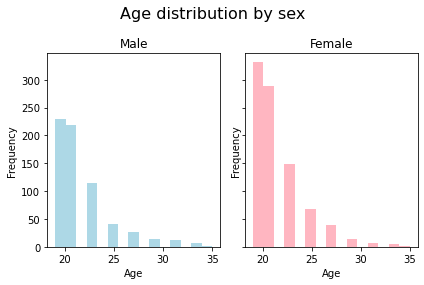

In [37]:
fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)

fig.suptitle('Age distribution by sex', fontsize=16)

axs[0].hist(GSP_demographics_cleaned.Age_Bin[GSP_demographics_cleaned.Sex == 'M'], bins=15, color = 'lightblue')
axs[0].set_title('Male')
axs[0].set_xlabel('Age')
axs[0].set_ylabel('Frequency')

axs[1].hist(GSP_demographics_cleaned.Age_Bin[GSP_demographics_cleaned.Sex == 'F'], bins=15, color = 'lightpink')
axs[1].set_title('Female')
axs[1].set_xlabel('Age')
axs[1].set_ylabel('Frequency')

## Descriptive HCP

### Load data

In [38]:
restricted_data = pd.read_csv(datadir+'RESTRICTED_wanb_9_29_2020_2_14_36.csv')  # contains ACTUAL age, race, ethnicity, handedness, income, education, menstrual cycle info
print(f'Sample with demographic (restricted) data: N = {len(restricted_data)}')

#restricted_data.keys()
#for i in restricted_data.keys():
#    print(i)

unrestricted_data = pd.read_csv(datadir+'unrestricted_wanb_9_14_2020_7_53_51.csv')  # sex ('gender'), BINNED age (in 5-year increments, 22-25, 26-30, 31-35, 35+), ICV ('FS_IntraCranial_Vol')
print(f'Sample with demographic (unrestricted) data: N = {len(unrestricted_data)}')

#unrestricted_data.keys
#for i in unrestricted_data.keys():
#    print(i)

Sample with demographic (restricted) data: N = 1206
Sample with demographic (unrestricted) data: N = 1206


### Making "cleaned" versions of the dataframes which only contain subjects who also have fc matrices

In [39]:
### restricted data

## set index as subject in order to drop subject rows by calling on subject ID
restricted_data_cleaned = restricted_data.set_index('Subject')

for subID in restricted_data.loc[:,'Subject']:
    if str(subID) not in HCP_sub_list:
        restricted_data_cleaned = restricted_data_cleaned.drop(subID)



### unrestricted data

## set index as subject in order to drop subject rows by calling on subject ID
unrestricted_data_cleaned = unrestricted_data.set_index('Subject')

for subID in unrestricted_data.loc[:,'Subject']:
    if str(subID) not in HCP_sub_list:
        unrestricted_data_cleaned = unrestricted_data_cleaned.drop(subID)
        
        
## creating and adding to the demographics dataframe a numerical variable for sex (for including sex as a covariate in partial correlation, throws error if include 'M' 'F' lables)
sex_num = []


for sex_letter in unrestricted_data_cleaned.Gender:
    
    if sex_letter == 'M':
        sex_num.append(0)
        
    elif sex_letter == 'F':
        sex_num.append(1)
        
    else:  # just in case, but there are none
        sex_num.append('n/a') 

unrestricted_data_cleaned['sex_num'] = sex_num
#unrestricted_data_cleaned.sex_num.value_counts()

### Creating a merged demographic dataframe (from restricted and unrestricted data)

In [40]:
# merge based on index of both left dataset (unrestricted) and right dataset (restricted)
HCP_demographics_cleaned = pd.merge(unrestricted_data_cleaned, restricted_data_cleaned, left_index=True, right_index=True)

### Creating a variable describing twin status (MZ, DZ, sibling, unrelated)

#### This is for linear mixed effect model -> controling for family and twin status 

In [41]:
### Make a list containing the family IDs that have multiple siblings

HCP_family_IDs = []  # contains all family IDs (without duplicates)
HCP_family_IDs_related = []  # contains family IDs of subjects that have relatives in sample ("duplicated" family IDs) - each ID appearing only 1x

# loop over all subjects
for i in range(len(HCP_demographics_cleaned)):
   
    # conditions to append family ID in HCP_family_IDs_related df:
    # if the current sub's family ID is already in the HCP_family_IDs, it means that we have looped over this family ID before therefore there are siblings sharing this family_ID in the dataset; AND
    # because we don't want duplicate family IDs in HCP_family_IDs_related: if the current sub's family ID is not yet in HCP_family_IDs_related -> we need to append it
    if (HCP_demographics_cleaned.Family_ID.iloc[i] in HCP_family_IDs) & (HCP_demographics_cleaned.Family_ID.iloc[i] not in HCP_family_IDs_related):
        HCP_family_IDs_related.append(HCP_demographics_cleaned.Family_ID.iloc[i])
    
    if HCP_demographics_cleaned.Family_ID.iloc[i] not in HCP_family_IDs: 
        HCP_family_IDs.append(HCP_demographics_cleaned.Family_ID.iloc[i])
        
        
        
### create a list containing (in order of participants) those that have other family members in the sample based on their family ID (if it is present in list HCP_family_IDs_related)

family_members_in_sample = []

for i in HCP_demographics_cleaned['Family_ID'] :
    if i in HCP_family_IDs_related:
        family_members_in_sample.append(1)
    else:
        family_members_in_sample.append(0)



### create a new variable variable that specifies the twin status (i.e., MZ, DZ, sibling, unrelated)
# based on family_members_in_sample and Zygosity variables 
    # ZygosityGT (determined via genotyping) should be given precedence over ZygositySR (self-reported) 
    # Genotyping was only done when both subjects in a twin pair to have HasGT=TRUE to have a value (if genotyping is not available for either of a twin pair, no values are given for ZygosityGT)
    # Non-twin subjects also do not have a value for ZygosityGT
    # Note that some subjects self-reported as dizygotic twins (ZygositySR='NotMZ') but genotyping established that they were monozygotic twins (thence ZygosityGT='MZ' for those subjects)
    # including the empty ZygosityGT condition so that ZygositySR does not override GT    

TwinStatus = []

for i in range(len(HCP_demographics_cleaned)):
    if family_members_in_sample[i] == 1:
        if HCP_demographics_cleaned.ZygosityGT.iloc[i] == 'MZ' or (HCP_demographics_cleaned.ZygosityGT.iloc[i] == ' ' and HCP_demographics_cleaned.ZygositySR.iloc[i] == 'MZ'):
            TwinStatus.append('MZ')
        elif HCP_demographics_cleaned.ZygosityGT.iloc[i] == 'DZ' or (HCP_demographics_cleaned.ZygosityGT.iloc[i] == ' ' and HCP_demographics_cleaned.ZygositySR.iloc[i] == 'NotMZ'):
            TwinStatus.append('DZ')
        else:
            TwinStatus.append('sibling')
    elif family_members_in_sample[i] == 0:
        TwinStatus.append('unrelated')

HCP_demographics_cleaned['TwinStatus'] = TwinStatus



### creating a numerical version of TwinStatus variable (for including TwinStatus as a covariate in partial correlation, throws error if include string lables)
TwinStatus_num = []


for twinstatus_letter in HCP_demographics_cleaned.TwinStatus:
    
    if twinstatus_letter == 'MZ':
        TwinStatus_num.append(0)
        
    elif twinstatus_letter == 'DZ':
        TwinStatus_num.append(1)
    
    elif twinstatus_letter == 'sibling':
        TwinStatus_num.append(2)
    
    elif twinstatus_letter == 'unrelated':
        TwinStatus_num.append(3)

HCP_demographics_cleaned['TwinStatus_num'] = TwinStatus_num
#HCP_demographics_cleaned.TwinStatus_num.value_counts()

In [42]:
# for some reason, the partial correlation does not work when including Family_ID large numbers (10 digits <) as covariate - therefore, here we create new family IDs starting from 1 (whilst of course preserving family relatedness)

# dictionary that will include the correspondance of original IDs and new IDs (only for related individuals, unrelated will be easily numbered on top)
fam_ID_correspondance_dict = {}

for i in range(len(HCP_family_IDs_related)):
    
    # create a new dictionary entry with the original family ID and it's new corresponding family ID (starting with 1 not to make any issue with zero) -> IDs going from 1 to 347 (as there are 347 related families in sample)
    fam_ID_correspondance_dict[HCP_family_IDs_related[i]] = i+1

    
# creating a new variable for dataframe which will contain the new family IDs     
Family_ID_num = []
n = 0  

# iterate over all family IDs
for family_id in restricted_data_cleaned.Family_ID:
    
    # if it's a family ID of a family that has related individuals in sample, go fetch its new family ID in the dictionary and append it to the list
    if family_id in HCP_family_IDs_related:
        Family_ID_num.append(fam_ID_correspondance_dict[family_id])
    
    # if it's the family ID of an unrelated individual, create a new family ID by adding n to the len(family_related) (i.e., 347) - n is also being incremented each time we come across an unrelated subject in loop
    else:
        n += 1
        Family_ID_num.append(len(HCP_family_IDs_related)+n) # new family IDs for unrelated individuals

HCP_demographics_cleaned['Family_ID_num'] = Family_ID_num

In [43]:
print(f"N = {len(HCP_demographics_cleaned)}\n"
      f"{np.sum(HCP_demographics_cleaned.Gender == 'F')} females, {np.sum(HCP_demographics_cleaned.Gender == 'M')} males\n"
      f"Mean subject age: {np.mean(HCP_demographics_cleaned.Age_in_Yrs):.2f}, SD: {np.std(HCP_demographics_cleaned.Age_in_Yrs):.2f}, range: {np.min(HCP_demographics_cleaned.Age_in_Yrs):.2f} - {np.max(HCP_demographics_cleaned.Age_in_Yrs):.2f}\n"
      f"Mean ICV: {np.mean(HCP_demographics_cleaned.FS_IntraCranial_Vol):.2f}, SD: {np.std(HCP_demographics_cleaned.FS_IntraCranial_Vol):.2f}, range: {np.min(HCP_demographics_cleaned.FS_IntraCranial_Vol):.2f} - {np.max(HCP_demographics_cleaned.FS_IntraCranial_Vol):.2f}\n"
      f"Sample relatedness: {np.sum(HCP_demographics_cleaned.TwinStatus == 'MZ')} MZ twins, {np.sum(HCP_demographics_cleaned.TwinStatus == 'DZ')} DZ twins, {np.sum(HCP_demographics_cleaned.TwinStatus == 'sibling')} other siblings, {np.sum(HCP_demographics_cleaned.TwinStatus == 'unrelated')} unrelated individuals"
     )

N = 1014
544 females, 470 males
Mean subject age: 28.74, SD: 3.71, range: 22.00 - 37.00
Mean ICV: 1583398.49, SD: 186723.28, range: 831208.30 - 2143193.92
Sample relatedness: 293 MZ twins, 186 DZ twins, 452 other siblings, 83 unrelated individuals


### Export demographics dataframe to csv for R analyses
commented out because the most updated version is that containing global_ct (from the p1_main_structure script)

### Testing differences in age between the sexes (given that I will test sex differences without matching for age)

In [44]:
# Levene's test for equality of variances -> non-significant differences means equality, can contiunue with parametric independent samples t-test
stats.levene(HCP_demographics_cleaned.Age_in_Yrs[HCP_demographics_cleaned.Gender == 'M'], HCP_demographics_cleaned.Age_in_Yrs[HCP_demographics_cleaned.Gender == 'F'])

LeveneResult(statistic=0.14932057395328685, pvalue=0.6992667192352071)

In [45]:
stats.ttest_ind(HCP_demographics_cleaned.Age_in_Yrs[HCP_demographics_cleaned.Gender == 'M'], HCP_demographics_cleaned.Age_in_Yrs[HCP_demographics_cleaned.Gender == 'F'])

Ttest_indResult(statistic=-7.069267321913692, pvalue=2.899004078650321e-12)

Text(0, 0.5, 'Frequency')

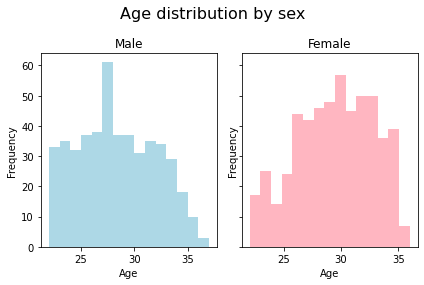

In [46]:
fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)

fig.suptitle('Age distribution by sex', fontsize=16)

axs[0].hist(HCP_demographics_cleaned.Age_in_Yrs[HCP_demographics_cleaned.Gender == 'M'], bins=15, color = 'lightblue')
axs[0].set_title('Male')
axs[0].set_xlabel('Age')
axs[0].set_ylabel('Frequency')

axs[1].hist(HCP_demographics_cleaned.Age_in_Yrs[HCP_demographics_cleaned.Gender == 'F'], bins=15, color = 'lightpink')
axs[1].set_title('Female')
axs[1].set_xlabel('Age')
axs[1].set_ylabel('Frequency')

# Computing functional gradients

## Mean gradients

*Needed for figures and for computing aligned gradients*

### GSP

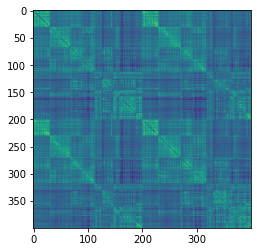

(400, 400)


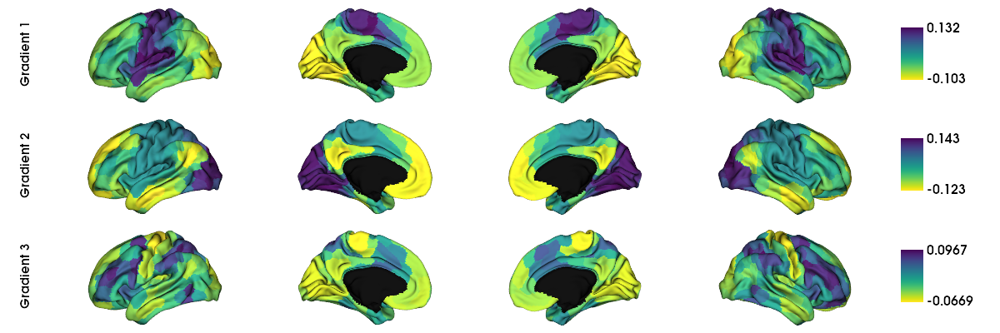

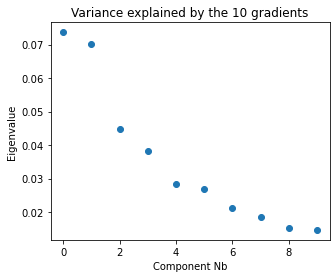

Total amount of variance explained by the 10 gradients (uncorrected sum lambdas): 0.35

Scaled variance explained by individual gradients:
G1: 20.93%
G2: 19.95%
G3: 12.77%



In [55]:
# compute the mean connectivity matrix (by averaging the connectivity matrices of all subjects)
GSP_mean_fc_matrix = sum(GSP_fc_matrices)/len(GSP_fc_matrices)

# compute mean gradients
# DON'T SAVE SCREENSHOT -> NEED TO FLIP GRADIENT DIRECTION (later in code)
GSP_mean_fc_grad = compute_mean_gradients(mean_conn_matrix = GSP_mean_fc_matrix, display_output = True, data_reduction_algorithm = 'dm', save_screenshot = False, sample_modality = 'GSP_fc')

### HCP

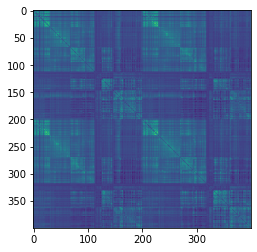

(400, 400)


'/data/p_02667/sex_diff_gradients/results/figures/HCP_fc_plotted_hemispheres_mean_gradients.png'

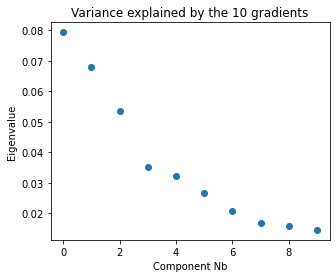

Total amount of variance explained by the 10 gradients (uncorrected sum lambdas): 0.36

Scaled variance explained by individual gradients:
G1: 21.85%
G2: 18.71%
G3: 14.74%



In [56]:
# compute the mean connectivity matrix (by averaging the connectivity matrices of all subjects)
HCP_mean_fc_matrix = sum(HCP_fc_matrices)/len(HCP_fc_matrices)

# compute mean gradients
HCP_mean_fc_grad = compute_mean_gradients(mean_conn_matrix = HCP_mean_fc_matrix, display_output = True, data_reduction_algorithm = 'dm', save_screenshot = True, sample_modality = 'HCP_fc')

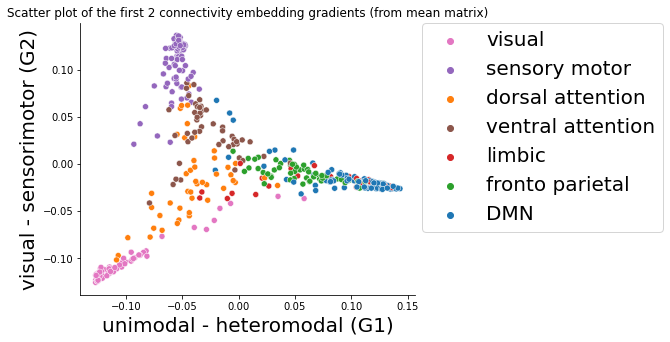

In [47]:
# scatterplot
fig, ax = plt.subplots(figsize=(6,5));
ax = sns.scatterplot(x=HCP_mean_fc_grad.gradients_[:,0],  # all rows (400 parces), first column (G1: unimodal - heteromodal)
                     y=HCP_mean_fc_grad.gradients_[:,1],  # all rows (400 parces), second column (G2: visual - somatomotor)
                     hue=yeo7_networks_array_labels,  # gives color coding based on yeo networks
                     palette=palette_labeled_networks,
                     legend=True, ax=ax);

ax.set_xlabel('unimodal - heteromodal (G1)', fontsize = 20);
ax.set_ylabel('visual - sensorimotor (G2)', fontsize = 20);
ax.set_title("Scatter plot of the first 2 connectivity embedding gradients (from mean matrix)")
ax.spines['right'].set_visible(False);
ax.spines['top'].set_visible(False);
plt.legend(title='Yeo networks')

ax.legend(fontsize=20, bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0)
#ax.legend(loc=2, prop={'size': 6})

plt.show(ax)

### Post-Hoc changes to GSP mean gradients (G2 sign flip) to make comparable to HCP

**From gradient inspection, noticed that the directionality of Gradient 2 in GSP data (unimodal-heteromodal gradient) does not match that of Gradient 1 in HCP data (unimodal-heteromodal gradient)**


**!!! To make results more easily comparable, creating a new array of mean_grad with a flipped directionality for G2 only (i.e., x -1) !!!**

**!!! Thus: FOR GSP, USE THE RESULTS BELOW !!!**

Explanations
- Flipping directionality is okbecause it doesn't really matter what directionality a gradient has, important is that it has a directionality (it is a gradient)
- It is possible to only flip one gradient because gradients are independent of one another
- Only G2 mean gradient needs to be flipped here because then will do procrustus alignment with new set of mean gradients (only G2 flipped) and all the individual gradients should have this directionality

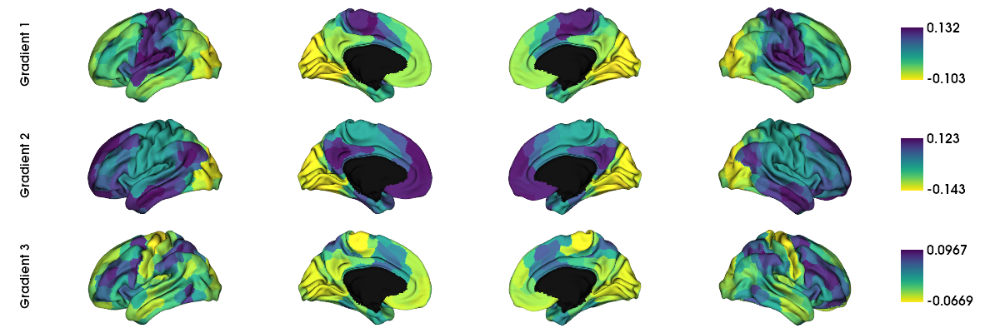

In [58]:
## make a new array for GSP mean gradients that is comparable to the HCP directionality of mean gradients (i.e., need to flip G2)

# list containing gradients matching directionality of HCP gradients (to make results more comparable)
GSP_mean_fc_grad_comparable = []

# counter for iteration
grad_count = 0

# iterating over transposed array of gradients because original shape is (400,10) but it's easier to access G2 from a (10,400) shape 
for grad in GSP_mean_fc_grad.gradients_.T:
    
    grad_count += 1

    # append to GSP_mean_fc_grad_comparable the current gradient - only flip the directionality of G2 (to match G1 HCP), for the rest append as is
    if grad_count == 2:
        GSP_mean_fc_grad_comparable.append(grad*-1)
        
    else:
        GSP_mean_fc_grad_comparable.append(grad)

# need to make gradient list back into an array and transpose it back to initial (400, 10) shape
GSP_mean_fc_grad_comparable = np.array(GSP_mean_fc_grad_comparable).T


## plot the fist three gradients of the new GSP gradient array (i.e., with flipped G2)

# defining labeling scheme and mask
labeling = load_parcellation('schaefer', scale=400, join=True)
surf_lh, surf_rh = load_conte69()

mask = labeling != 0


# list containing placeholders (None) for the number of gradients I want to plot
grad = [None] * 3

for i in range(3):
    # map the gradient to the parcels
    grad[i] = map_to_labels((GSP_mean_fc_grad_comparable)[:, i], labeling, mask=mask, fill=np.nan)  # mean_grad contains 10 .gradients_ (1 gradient per column) - here I take all rows and individual select column based on gradient I want (first 3)

plot_hemispheres(surf_lh, 
                 surf_rh, 
                 array_name=grad, 
                 embed_nb = True, 
                 size=(1200, 400), 
                 cmap='viridis_r', 
                 color_bar=True, 
                 label_text=['Gradient 1', 'Gradient 2', 'Gradient 3'], 
                 zoom=1.55,
                 screenshot = False,
                 filename = resdir_fig+'GSP_fc'+'_plotted_hemispheres_mean_gradients.png')

**!! From here on, need to use:**

**GSP_mean_fc_grad_comparable** instead of **GSP_mean_fc_grad_.gradients_ !!** e.g., when using or diplaying mean gradients (on hemispheres or on plot G1 vs G2), or when computing aligned gradients

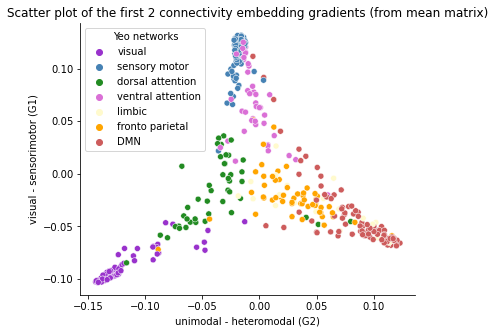

In [59]:
# scatterplot
fig, ax = plt.subplots(figsize=(6,5));
ax = sns.scatterplot(x=GSP_mean_fc_grad_comparable[:,1],  # all rows (400 parcels), second column (G2: unimodal - heteromodal)
                     y=GSP_mean_fc_grad_comparable[:,0],  # all rows (400 parcels), first column (G1: visual - somatomotor)
                     hue=yeo7_networks_array_labels,  # gives color coding based on yeo networks
                     palette=palette_labeled_networks, 
                     legend=True, ax=ax);

ax.set_xlabel('unimodal - heteromodal (G2)');
ax.set_ylabel('visual - sensorimotor (G1)');
ax.set_title("Scatter plot of the first 2 connectivity embedding gradients (from mean matrix)")
ax.spines['right'].set_visible(False);
ax.spines['top'].set_visible(False);
plt.legend(title='Yeo networks')
plt.show(ax)

### Export mean_fc_matrix for structure-function analyses

In [60]:
# all subjects
np.savetxt(resdir_gsp+'GSP_mean_fc_matrix.csv', GSP_mean_fc_matrix, delimiter=",")
np.savetxt(resdir_hcp+'HCP_mean_fc_matrix.csv', HCP_mean_fc_matrix, delimiter=",")

## Aligned gradients

Construct gradients for all subjects (procrustes alignment to the overall mean matrix)

In [51]:
GSP_compute_aligned_grad = compute_aligned_gradients(GSP_fc_matrices, GSP_mean_fc_grad_comparable)

# storing the output of the computation of the aligned gradients
#GSP_array_aligned_gradients = GSP_compute_aligned_grad['array_aligned_gradients']
GSP_array_aligned_fc_G1 = GSP_compute_aligned_grad['array_aligned_G1']
GSP_array_aligned_fc_G2 = GSP_compute_aligned_grad['array_aligned_G2']
GSP_array_aligned_fc_G3 = GSP_compute_aligned_grad['array_aligned_G3']

In [52]:
HCP_compute_aligned_grad = compute_aligned_gradients(HCP_fc_matrices, HCP_mean_fc_grad.gradients_)

# storing the output of the computation of the aligned gradients
#HCP_array_aligned_gradients = HCP_compute_aligned_grad['array_aligned_gradients']
HCP_array_aligned_fc_G1 = HCP_compute_aligned_grad['array_aligned_G1']
HCP_array_aligned_fc_G2 = HCP_compute_aligned_grad['array_aligned_G2']
HCP_array_aligned_fc_G3 = HCP_compute_aligned_grad['array_aligned_G3']

### Exporting Gradients to csv for R analyses

In [53]:
# fmt = decimals, header = 1 to 400 (without the first and last string letter because it's the [] of the list, comments = empty because otherwise gives a #

np.savetxt(resdir_gsp+'array_aligned_fc_G1.csv', GSP_array_aligned_fc_G1, delimiter=',', fmt = '%.16g', header = str(list(range(1,401)))[1:-1], comments = '')
np.savetxt(resdir_gsp+'array_aligned_fc_G2.csv', GSP_array_aligned_fc_G2, delimiter=',', fmt = '%.16g', header = str(list(range(1,401)))[1:-1], comments = '')
np.savetxt(resdir_gsp+'array_aligned_fc_G3.csv', GSP_array_aligned_fc_G3, delimiter=',', fmt = '%.16g', header = str(list(range(1,401)))[1:-1], comments = '')

np.savetxt(resdir_hcp+'array_aligned_fc_G1.csv', HCP_array_aligned_fc_G1, delimiter=',', fmt = '%.16g', header = str(list(range(1,401)))[1:-1], comments = '')
np.savetxt(resdir_hcp+'array_aligned_fc_G2.csv', HCP_array_aligned_fc_G2, delimiter=',', fmt = '%.16g', header = str(list(range(1,401)))[1:-1], comments = '')
np.savetxt(resdir_hcp+'array_aligned_fc_G3.csv', HCP_array_aligned_fc_G3, delimiter=',', fmt = '%.16g', header = str(list(range(1,401)))[1:-1], comments = '')

## Mean gradients by sex

*Needed for plotting (mean) Males vs (mean) Females if plan to replicate this figure from Hong et al https://www.nature.com/articles/s41467-019-08944-1/figures/3*

**NEXT STEPS -> see at the bottom of the notebook, attempts to make figure resemble Hong et al.'s:**

### GSP

In [54]:
# creating lists containing only male and only female fc matrices

GSP_fc_matrices_M = []
GSP_fc_matrices_F = []

for i in range(len(GSP_fc_matrices)):
    if GSP_demographics_cleaned.Sex.iloc[i] == "M":
        GSP_fc_matrices_M.append(GSP_fc_matrices[i])
    elif GSP_demographics_cleaned.Sex.iloc[i] == "F":
        GSP_fc_matrices_F.append(GSP_fc_matrices[i])

#### Males

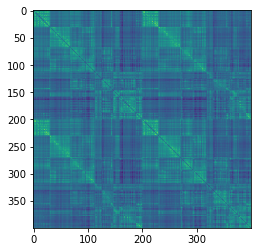

(400, 400)


/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


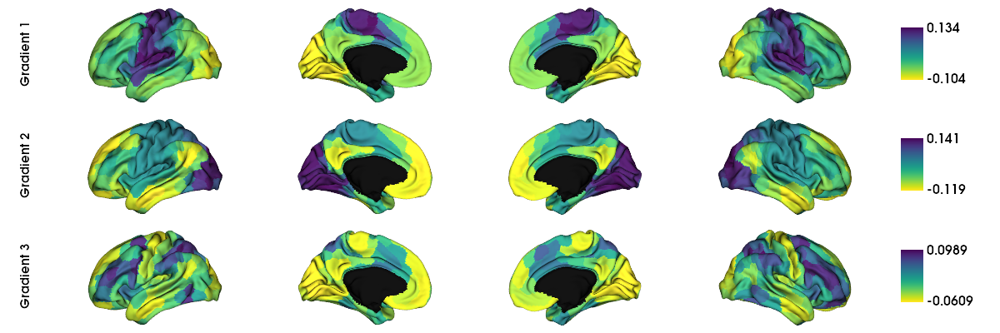

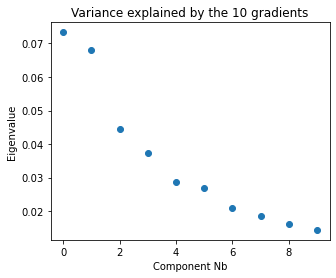

Total amount of variance explained by the 10 gradients (uncorrected sum lambdas): 0.35

Scaled variance explained by individual gradients:
G1: 21.01%
G2: 19.52%
G3: 12.74%



In [55]:
# compute the mean connectivity matrix (by averaging the connectivity matrices of all males)
GSP_mean_fc_matrix_M = sum(GSP_fc_matrices_M)/len(GSP_fc_matrices_M)

# compute mean gradients
GSP_mean_fc_grad_M = compute_mean_gradients(mean_conn_matrix = GSP_mean_fc_matrix_M, display_output = True, data_reduction_algorithm = 'dm')

#### Females

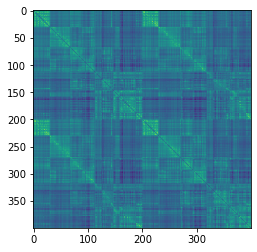

(400, 400)


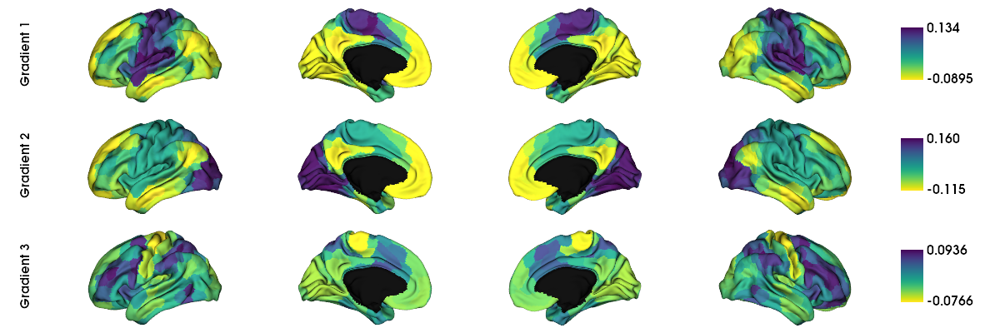

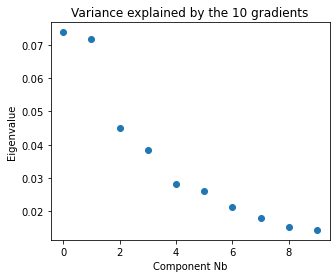

Total amount of variance explained by the 10 gradients (uncorrected sum lambdas): 0.35

Scaled variance explained by individual gradients:
G1: 20.91%
G2: 20.36%
G3: 12.80%



In [56]:
# compute the mean connectivity matrix (by averaging the connectivity matrices of all females)
GSP_mean_fc_matrix_F = sum(GSP_fc_matrices_F)/len(GSP_fc_matrices_F)

# compute mean gradients
GSP_mean_fc_grad_F = compute_mean_gradients(mean_conn_matrix = GSP_mean_fc_matrix_F, display_output = True, data_reduction_algorithm = 'dm')

### HCP

In [57]:
# creating lists containing only male and only female fc matrices

HCP_fc_matrices_M = []
HCP_fc_matrices_F = []

for i in range(len(HCP_fc_matrices)):
    if HCP_demographics_cleaned.Gender.iloc[i] == "M":
        HCP_fc_matrices_M.append(HCP_fc_matrices[i])
    elif HCP_demographics_cleaned.Gender.iloc[i] == "F":
        HCP_fc_matrices_F.append(HCP_fc_matrices[i])

#### Males

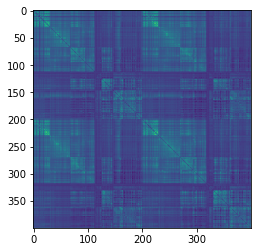

(400, 400)


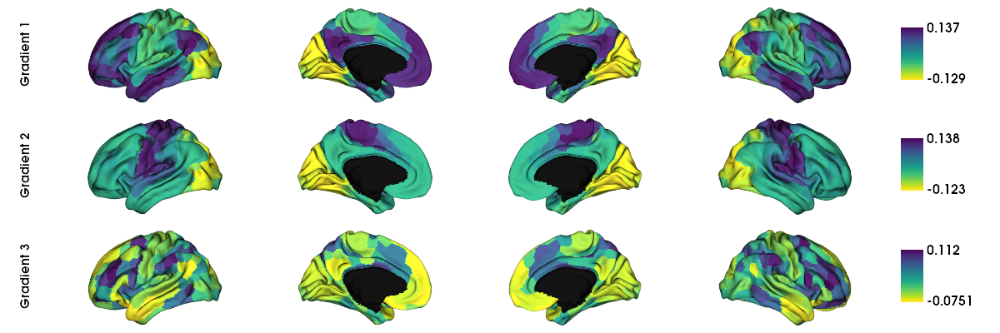

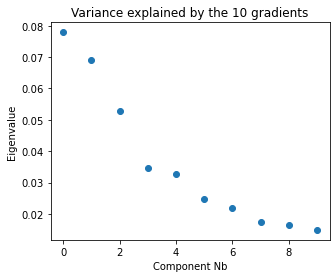

Total amount of variance explained by the 10 gradients (uncorrected sum lambdas): 0.36

Scaled variance explained by individual gradients:
G1: 21.51%
G2: 19.04%
G3: 14.61%



In [58]:
# compute the mean connectivity matrix (by averaging the connectivity matrices of all males)
HCP_mean_fc_matrix_M = sum(HCP_fc_matrices_M)/len(HCP_fc_matrices_M)

# compute mean gradients
HCP_mean_fc_grad_M = compute_mean_gradients(mean_conn_matrix = HCP_mean_fc_matrix_M, display_output = True, data_reduction_algorithm = 'dm')

#### Females

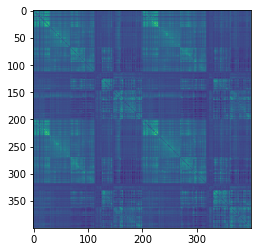

(400, 400)


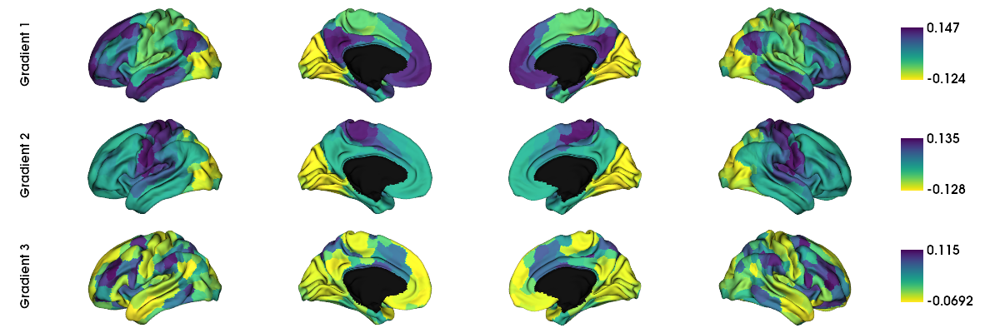

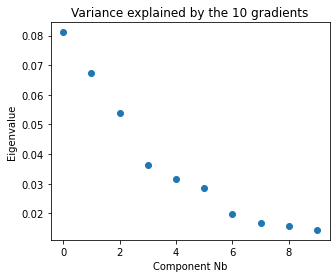

Total amount of variance explained by the 10 gradients (uncorrected sum lambdas): 0.36

Scaled variance explained by individual gradients:
G1: 22.24%
G2: 18.42%
G3: 14.73%



In [59]:
# compute the mean connectivity matrix (by averaging the connectivity matrices of all females)
HCP_mean_fc_matrix_F = sum(HCP_fc_matrices_F)/len(HCP_fc_matrices_F)

# compute mean gradients
HCP_mean_fc_grad_F = compute_mean_gradients(mean_conn_matrix = HCP_mean_fc_matrix_F, display_output = True, data_reduction_algorithm = 'dm')

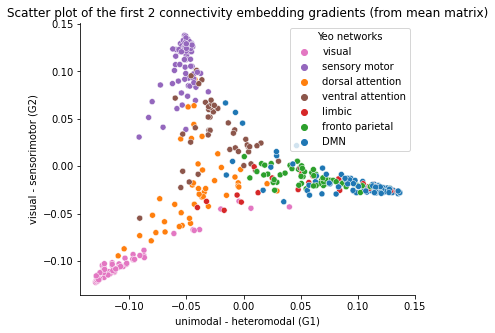

In [60]:
# scatterplot
fig, ax = plt.subplots(figsize=(6,5));
ax = sns.scatterplot(x=HCP_mean_fc_grad_M.gradients_[:,0],  # all rows (400 parces), first column (G1: unimodal - heteromodal)
                     y=HCP_mean_fc_grad_M.gradients_[:,1],  # all rows (400 parces), second column (G2: visual - somatomotor)
                     hue=yeo7_networks_array_labels,  # gives color coding based on yeo networks
                     palette=palette_labeled_networks,
                     legend=True, ax=ax);

ax.set_xlabel('unimodal - heteromodal (G1)');
ax.set_ylabel('visual - sensorimotor (G2)');
ax.set_title("Scatter plot of the first 2 connectivity embedding gradients (from mean matrix)")
ax.spines['right'].set_visible(False);
ax.spines['top'].set_visible(False);
plt.legend(title='Yeo networks')
plt.show(ax)

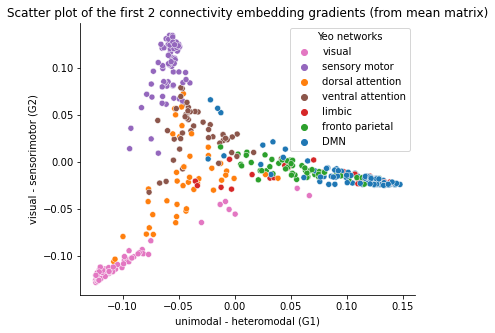

In [61]:
# scatterplot
fig, ax = plt.subplots(figsize=(6,5));
ax = sns.scatterplot(x=HCP_mean_fc_grad_F.gradients_[:,0],  # all rows (400 parces), first column (G1: unimodal - heteromodal)
                     y=HCP_mean_fc_grad_F.gradients_[:,1],  # all rows (400 parces), second column (G2: visual - somatomotor)
                     hue=yeo7_networks_array_labels,  # gives color coding based on yeo networks
                     palette=palette_labeled_networks,
                     legend=True, ax=ax);

ax.set_xlabel('unimodal - heteromodal (G1)');
ax.set_ylabel('visual - sensorimotor (G2)');
ax.set_title("Scatter plot of the first 2 connectivity embedding gradients (from mean matrix)")
ax.spines['right'].set_visible(False);
ax.spines['top'].set_visible(False);
plt.legend(title='Yeo networks')
plt.show(ax)

#### Males vs Females

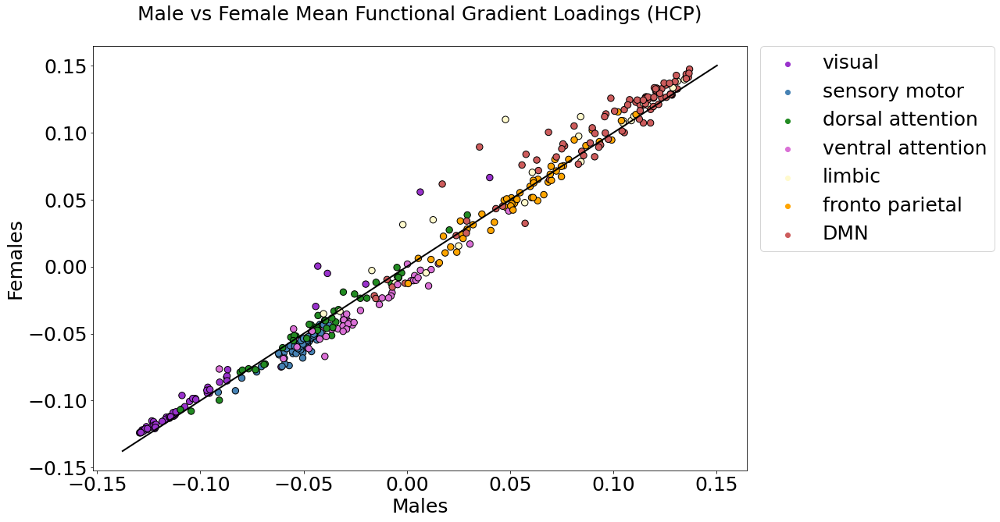

In [158]:
# plotting HCP G2 mean loadings
plot_mean_parcel_values_scatter_bysex(male_data = HCP_mean_fc_grad_M.gradients_[:,0], female_data = HCP_mean_fc_grad_F.gradients_[:,0], title = 'Mean Functional Gradient Loadings (HCP)')

### Post-Hoc changes to GSP mean gradients (G2 sign flip) to make comparable to HCP

Again need to flip G2 directionality in males and females separately

In [62]:
# list containing gradients matching directionality of HCP gradients (to make results more comparable)
GSP_mean_fc_grad_comparable_M = []
GSP_mean_fc_grad_comparable_F = []


## Males

# counter for iteration
grad_count = 0

# iterating over transposed array of gradients because original shape is (400,10) but it's easier to access G2 from a (10,400) shape 
for grad in GSP_mean_fc_grad_M.gradients_.T:
    
    grad_count += 1

    # append to mean_grad_hcp_directionality the current gradient - only flip the directionality of G2 (to match G1 HCP), for the rest append as is
    if grad_count == 2:
        GSP_mean_fc_grad_comparable_M.append(grad*-1)
        
    else:
        GSP_mean_fc_grad_comparable_M.append(grad)

# need to make gradient list back into an array and transpose it back to initial (400, 10) shape
GSP_mean_fc_grad_comparable_M = np.array(GSP_mean_fc_grad_comparable_M).T


## Females

# counter for iteration
grad_count = 0

# iterating over transposed array of gradients because original shape is (400,10) but it's easier to access G2 from a (10,400) shape 
for grad in GSP_mean_fc_grad_F.gradients_.T:
    
    grad_count += 1

    # append to mean_grad_hcp_directionality the current gradient - only flip the directionality of G2 (to match G1 HCP), for the rest append as is
    if grad_count == 2:
        GSP_mean_fc_grad_comparable_F.append(grad*-1)
        
    else:
        GSP_mean_fc_grad_comparable_F.append(grad)

# need to make gradient list back into an array and transpose it back to initial (400, 10) shape
GSP_mean_fc_grad_comparable_F = np.array(GSP_mean_fc_grad_comparable_F).T

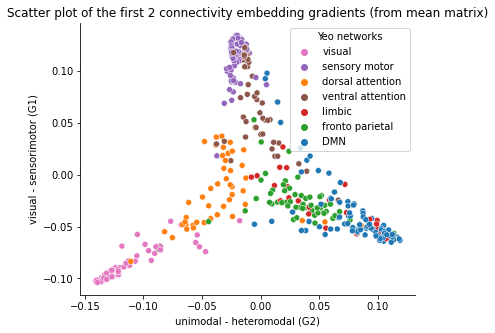

In [63]:
# scatterplot
fig, ax = plt.subplots(figsize=(6,5));
ax = sns.scatterplot(x=GSP_mean_fc_grad_comparable_M[:,1],  # all rows (400 parcels), second column (G2: unimodal - heteromodal)
                     y=GSP_mean_fc_grad_comparable_M[:,0],  # all rows (400 parcels), first column (G1: visual - somatomotor)
                     hue=yeo7_networks_array_labels,  # gives color coding based on yeo networks
                     palette=palette_labeled_networks, 
                     legend=True, ax=ax);

ax.set_xlabel('unimodal - heteromodal (G2)');
ax.set_ylabel('visual - sensorimotor (G1)');
ax.set_title("Scatter plot of the first 2 connectivity embedding gradients (from mean matrix)")
ax.spines['right'].set_visible(False);
ax.spines['top'].set_visible(False);
plt.legend(title='Yeo networks')
plt.show(ax)

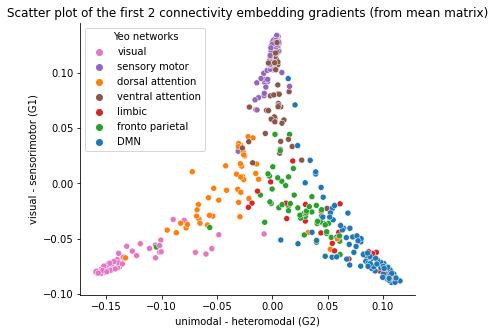

In [64]:
# scatterplot
fig, ax = plt.subplots(figsize=(6,5));
ax = sns.scatterplot(x=GSP_mean_fc_grad_comparable_F[:,1],  # all rows (400 parcels), second column (G2: unimodal - heteromodal)
                     y=GSP_mean_fc_grad_comparable_F[:,0],  # all rows (400 parcels), first column (G1: visual - somatomotor)
                     hue=yeo7_networks_array_labels,  # gives color coding based on yeo networks
                     palette=palette_labeled_networks, 
                     legend=True, ax=ax);

ax.set_xlabel('unimodal - heteromodal (G2)');
ax.set_ylabel('visual - sensorimotor (G1)');
ax.set_title("Scatter plot of the first 2 connectivity embedding gradients (from mean matrix)")
ax.spines['right'].set_visible(False);
ax.spines['top'].set_visible(False);
plt.legend(title='Yeo networks')
plt.show(ax)

#### Males vs Females

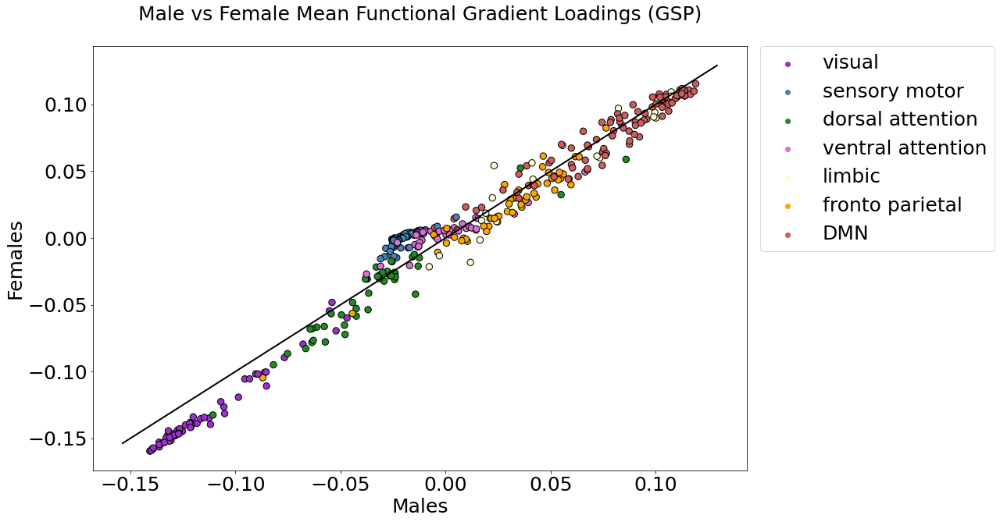

In [156]:
# plotting GSP G2 mean loadings
plot_mean_parcel_values_scatter_bysex(male_data = GSP_mean_fc_grad_comparable_M[:,1], female_data = GSP_mean_fc_grad_comparable_F[:,1], title = 'Mean Functional Gradient Loadings (GSP)')

Visualiasation of the first three gradients in males and females with flipped G2 (comparable to HCP's G1)

### Export mean_fc_matrix for structure-function analyses

In [65]:
np.savetxt(resdir_gsp+'GSP_mean_fc_matrix_M.csv', GSP_mean_fc_matrix_M, delimiter=",")
np.savetxt(resdir_gsp+'GSP_mean_fc_matrix_F.csv', GSP_mean_fc_matrix_F, delimiter=",")

np.savetxt(resdir_hcp+'HCP_mean_fc_matrix_M.csv', HCP_mean_fc_matrix_M, delimiter=",")
np.savetxt(resdir_hcp+'HCP_mean_fc_matrix_F.csv', HCP_mean_fc_matrix_F, delimiter=",")

# Visualizing functional gradients by network (and sex)

Using RainCloud plots https://github.com/RainCloudPlots/RainCloudPlots#python-environment

## Unimodal - Heteromodal gradient (G2 GSP; G1 HCP)

### GSP

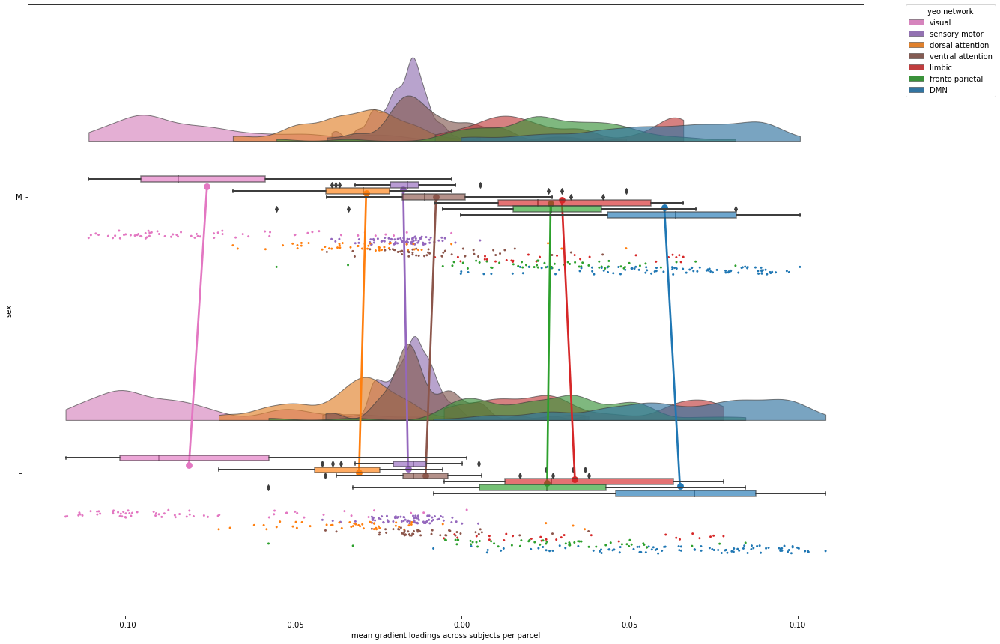

In [68]:
RainCloudPlot_YeoNetworks_SexComparison(array_grad = GSP_array_aligned_fc_G2, sex_comp = GSP_demographics_cleaned["Sex"])

### HCP

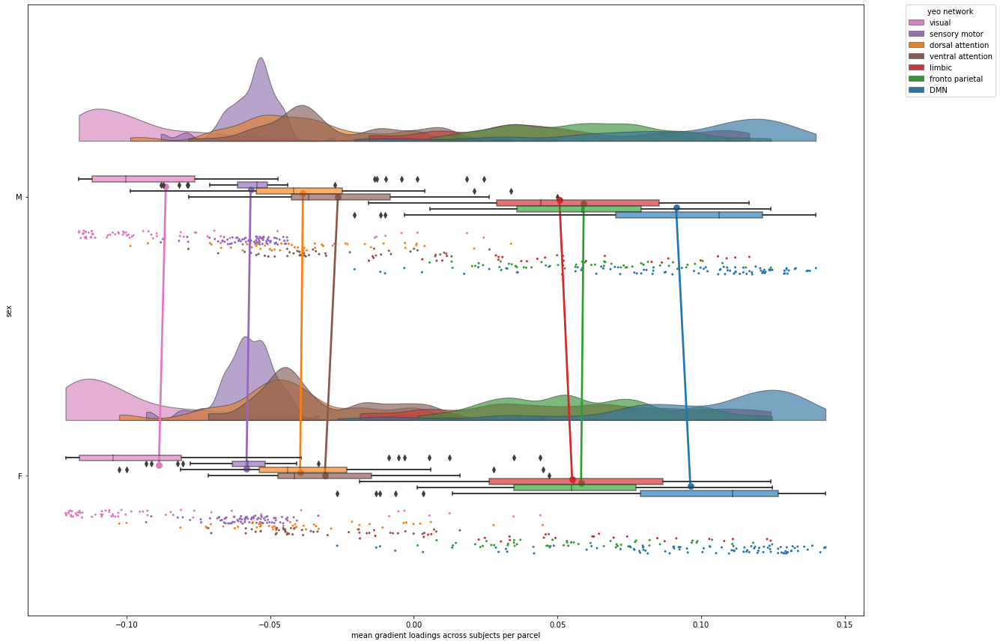

In [69]:
RainCloudPlot_YeoNetworks_SexComparison(array_grad = HCP_array_aligned_fc_G1, sex_comp = HCP_demographics_cleaned["Gender"])

## Visual - Sensorimotor gradient (G1 GSP; G2 HCP)

### GSP

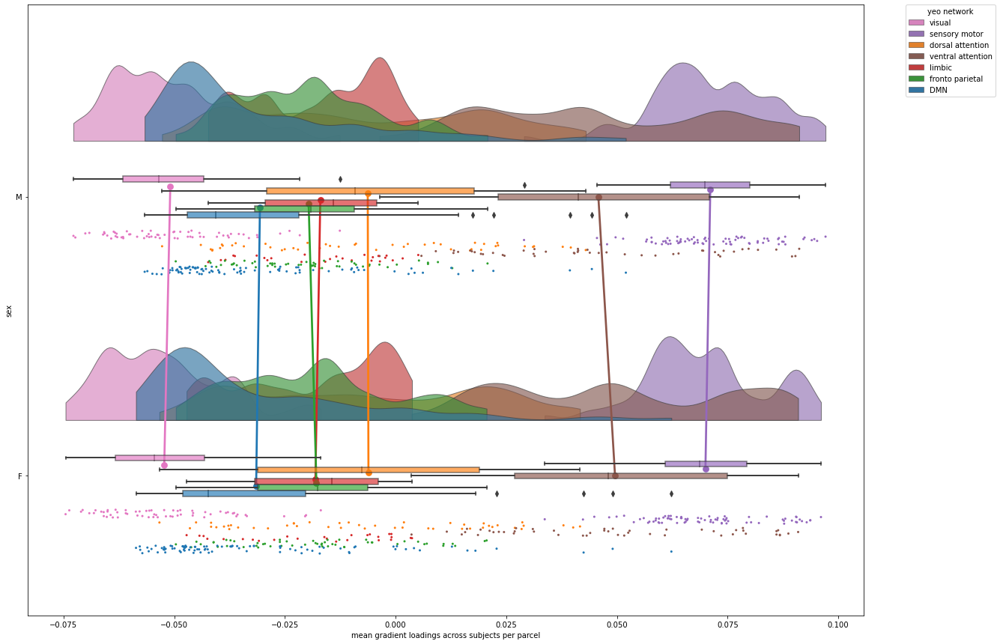

In [70]:
RainCloudPlot_YeoNetworks_SexComparison(array_grad = GSP_array_aligned_fc_G1, sex_comp = GSP_demographics_cleaned["Sex"])

### HCP

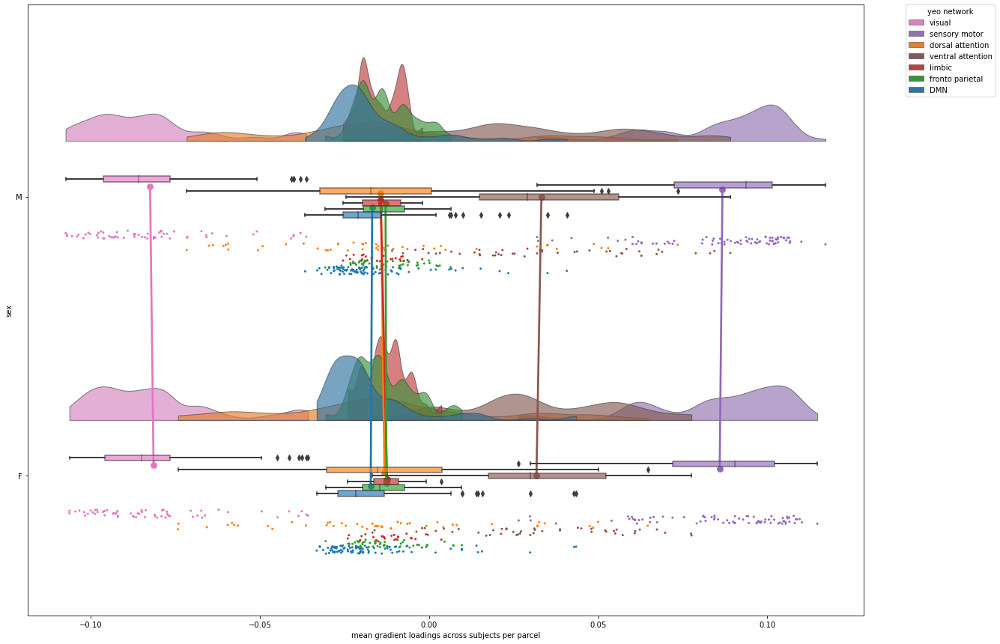

In [71]:
RainCloudPlot_YeoNetworks_SexComparison(array_grad = HCP_array_aligned_fc_G2, sex_comp = HCP_demographics_cleaned["Gender"])

# Sex effects functional gradients (standard linear regression - FDR-corrected 

In [61]:
# loading R results

# GSP model: linear model = Gradient_loadings ~ Sex + Age + ICV 
GSP_R_lm_fc_G1_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_fc_G1_sex_contrast_res.csv')  
GSP_R_lm_fc_G2_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_fc_G2_sex_contrast_res.csv')  
GSP_R_lm_fc_G3_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_fc_G3_sex_contrast_res.csv')  

# HCP model: linear mixed effects model = Gradient_loadings ~ Sex + Age + ICV + random effect family relatedness + random effect twin status + random effect (family relatedness * twin status) 
HCP_R_lmer_fc_G1_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_fc_G1_sex_contrast_res.csv')  
HCP_R_lmer_fc_G2_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_fc_G2_sex_contrast_res.csv')  
HCP_R_lmer_fc_G3_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_fc_G3_sex_contrast_res.csv')  

## Unimodal - Heteromodal gradient (G2 GSP; G1 HCP)

### GSP

Number of significant parcels: 105

Number of significant parcels for males: 56
Number of significant parcels for females: 49

Number of significant parcels in each Yeo network (across sexes):
- visual: 19 out of 61 (31.15%) -> 18.1% of overall significance
- sensory motor: 3 out of 77 (3.9%) -> 2.86% of overall significance
- DMN: 33 out of 90 (36.67%) -> 31.43% of overall significance
- dorsal attention: 5 out of 46 (10.87%) -> 4.76% of overall significance
- ventral attention: 20 out of 47 (42.55%) -> 19.05% of overall significance
- limbic: 11 out of 26 (42.31%) -> 10.48% of overall significance
- fronto parietal: 14 out of 53 (26.42%) -> 13.33% of overall significance





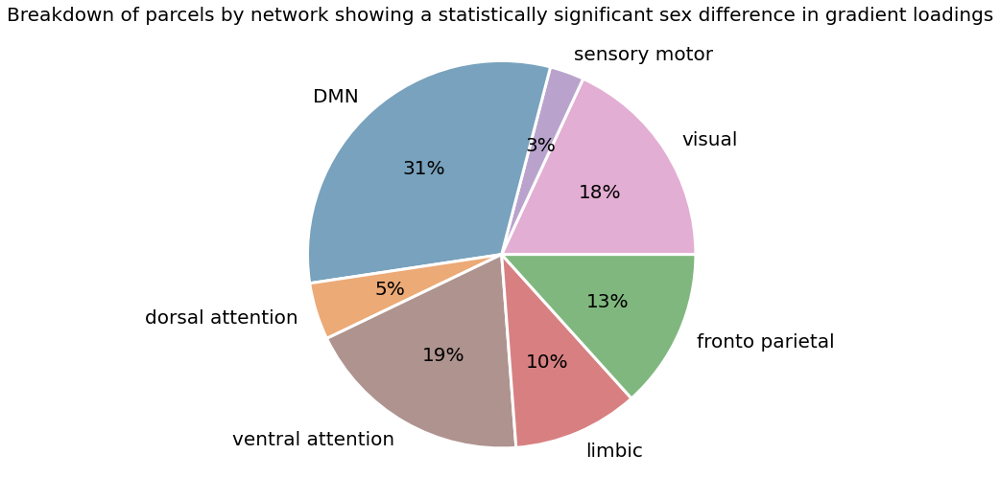

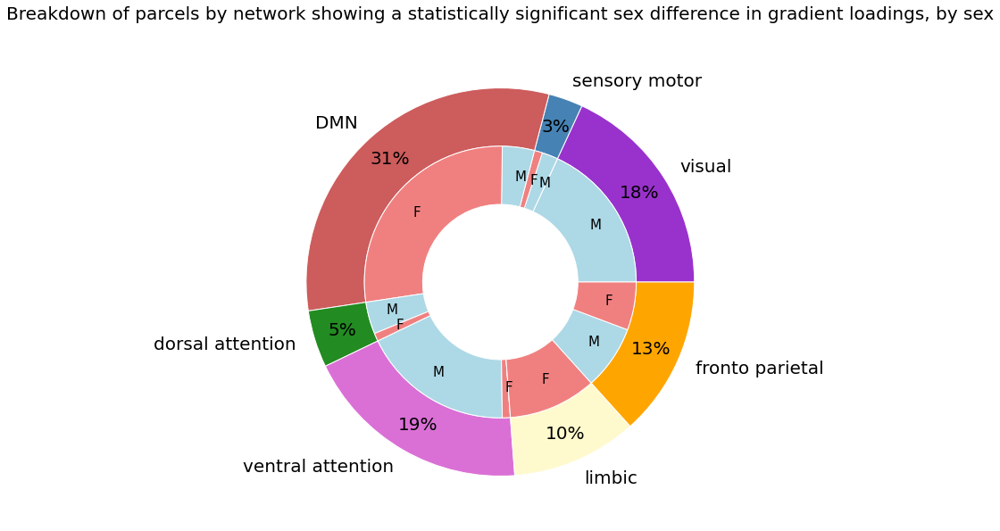

Number of significant parcels by sex:
visual - Male: 19, Female: 0
sensory motor - Male: 2, Female: 1
DMN - Male: 4, Female: 29
dorsal attention - Male: 4, Female: 1
ventral attention - Male: 19, Female: 1
limbic - Male: 0, Female: 11
fronto parietal - Male: 8, Female: 6





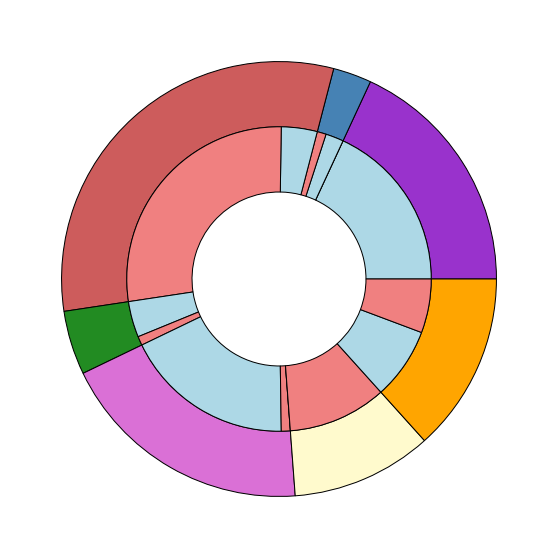




Violin plot of t-values (regression results) by Yeo network


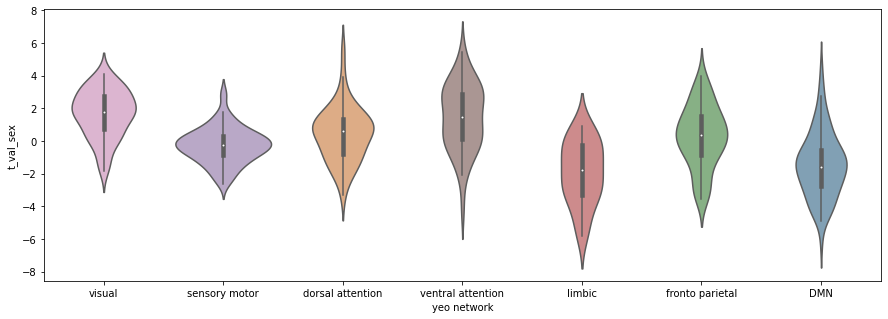

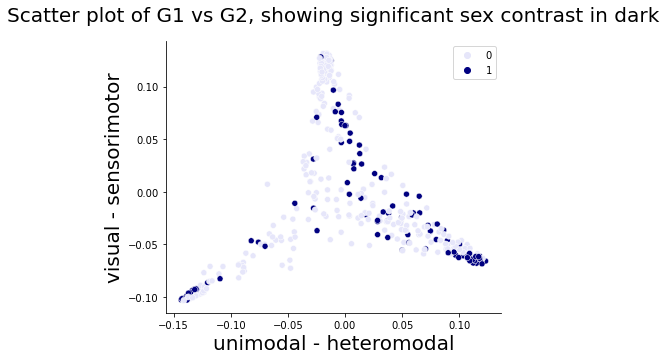

In [62]:
regression_contrast_results_breakdown_by_network(GSP_R_lm_fc_G2_sex_contrast_res, contrast_type = 'sex',
                                                 scatter_x = GSP_mean_fc_grad_comparable[:,1], scatter_y = GSP_mean_fc_grad_comparable[:,0],
                                                 scatter_x_label = 'unimodal - heteromodal',  scatter_y_label = 'visual - sensorimotor',
                                                 sample_modality = 'GSP_fc_G2')

/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


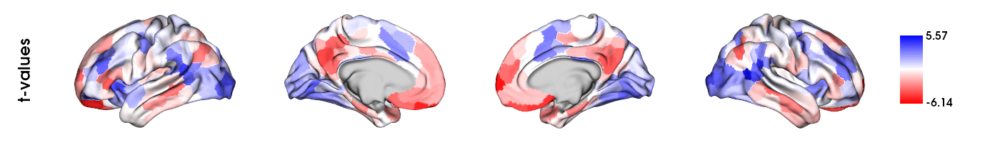

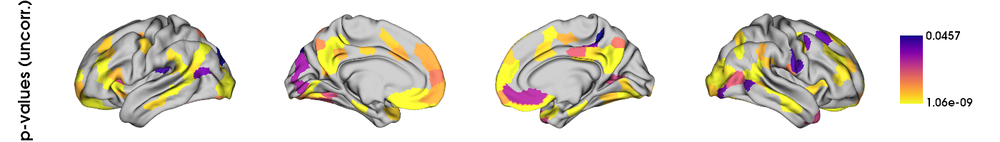

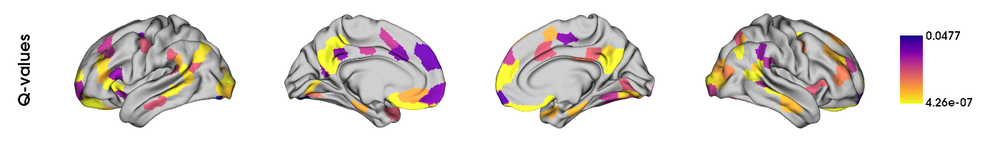

't-values for FDR-corrected q < 0.05: (male: blue, female: red)'

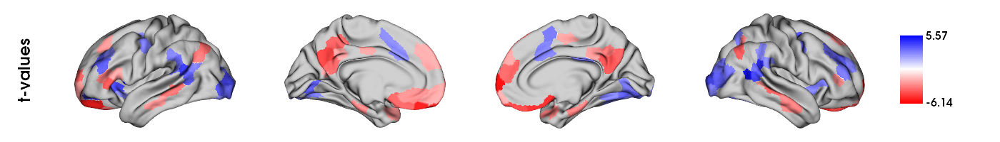

In [65]:
plots_to_display = plot_reg_results_R(GSP_R_lm_fc_G2_sex_contrast_res, save_screenshot = False, sample_modality = 'GSP_fc_G2')
display(*plots_to_display)

### HCP

Number of significant parcels: 134

Number of significant parcels for males: 82
Number of significant parcels for females: 52

Number of significant parcels in each Yeo network (across sexes):
- visual: 29 out of 61 (47.54%) -> 21.64% of overall significance
- sensory motor: 13 out of 77 (16.88%) -> 9.7% of overall significance
- DMN: 33 out of 90 (36.67%) -> 24.63% of overall significance
- dorsal attention: 6 out of 46 (13.04%) -> 4.48% of overall significance
- ventral attention: 30 out of 47 (63.83%) -> 22.39% of overall significance
- limbic: 5 out of 26 (19.23%) -> 3.73% of overall significance
- fronto parietal: 18 out of 53 (33.96%) -> 13.43% of overall significance





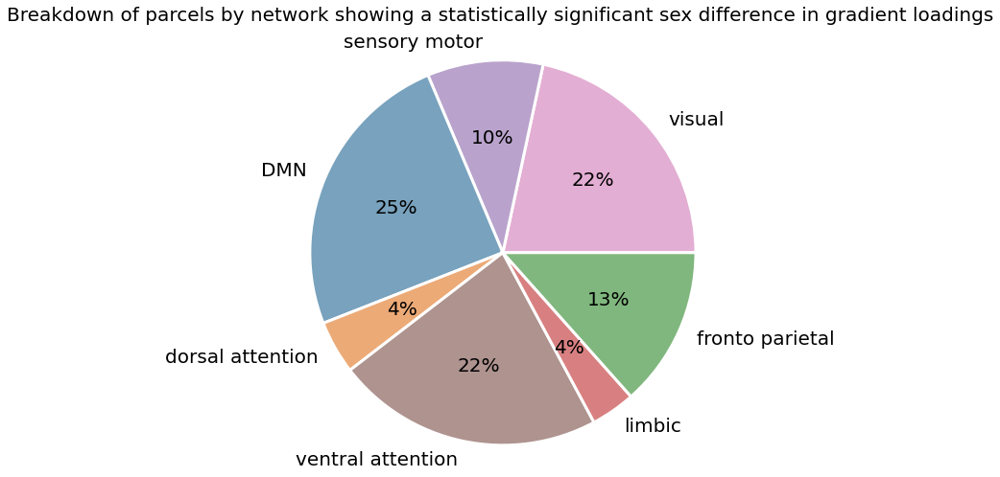

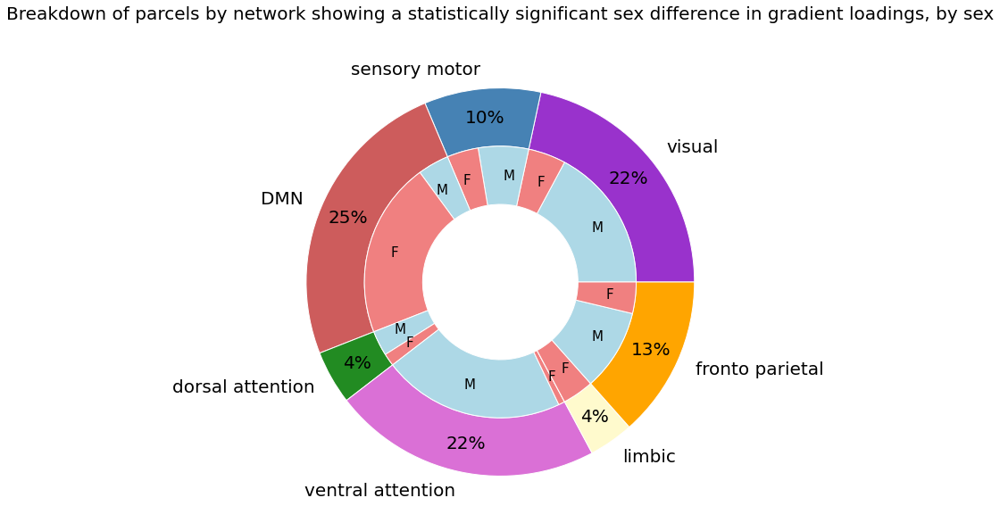

Number of significant parcels by sex:
visual - Male: 23, Female: 6
sensory motor - Male: 8, Female: 5
DMN - Male: 5, Female: 28
dorsal attention - Male: 4, Female: 2
ventral attention - Male: 29, Female: 1
limbic - Male: 0, Female: 5
fronto parietal - Male: 13, Female: 5





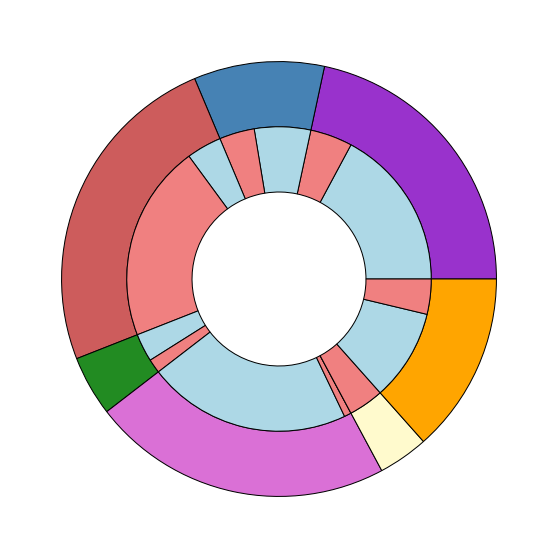




Violin plot of t-values (regression results) by Yeo network


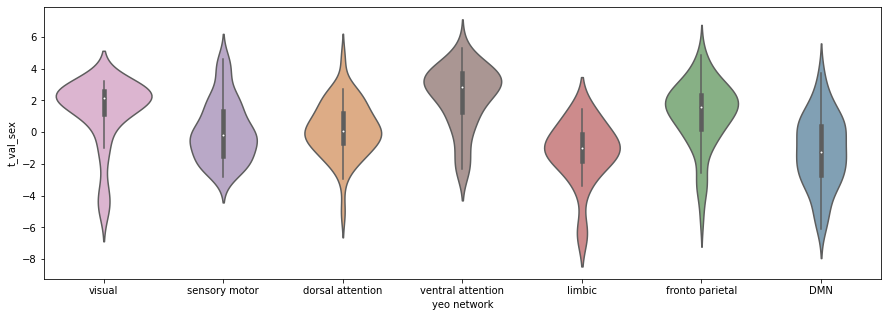

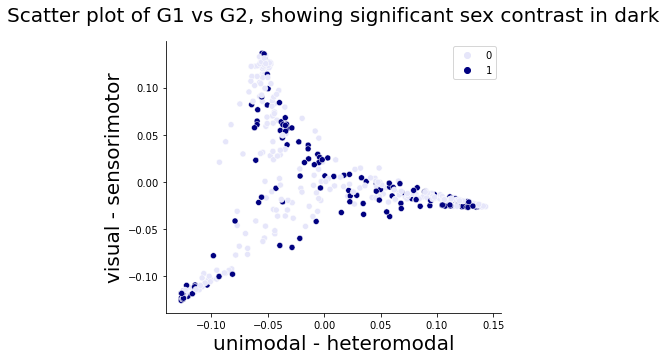

In [63]:
regression_contrast_results_breakdown_by_network(HCP_R_lmer_fc_G1_sex_contrast_res, contrast_type = 'sex', 
                                                 scatter_x = HCP_mean_fc_grad.gradients_[:,0], scatter_y = HCP_mean_fc_grad.gradients_[:,1], 
                                                 scatter_x_label = 'unimodal - heteromodal',  scatter_y_label = 'visual - sensorimotor',
                                                 sample_modality = 'HCP_fc_G1')

/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


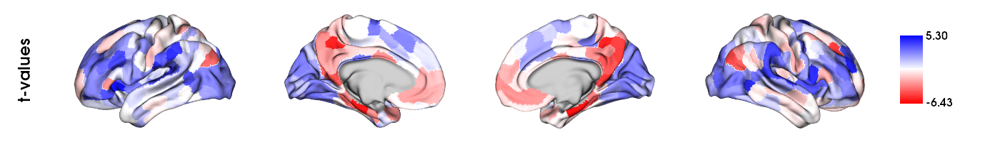

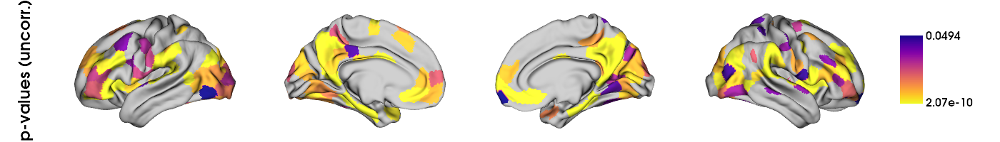

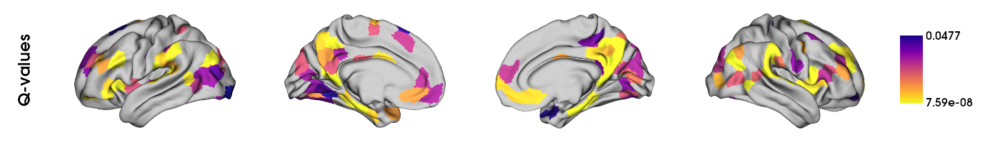

't-values for FDR-corrected q < 0.05: (male: blue, female: red)'

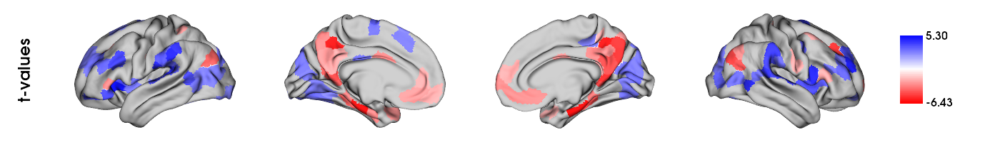

In [76]:
plots_to_display = plot_reg_results_R(HCP_R_lmer_fc_G1_sex_contrast_res)
display(*plots_to_display)

## Visual - Sensorimotor gradient (G1 GSP; G2 HCP)

### GSP

Number of significant parcels: 37

Number of significant parcels for males: 8
Number of significant parcels for females: 29

Number of significant parcels in each Yeo network (across sexes):
- visual: 0 out of 61 (0.0%) -> 0.0% of overall significance
- sensory motor: 2 out of 77 (2.6%) -> 5.41% of overall significance
- DMN: 10 out of 90 (11.11%) -> 27.03% of overall significance
- dorsal attention: 1 out of 46 (2.17%) -> 2.7% of overall significance
- ventral attention: 17 out of 47 (36.17%) -> 45.95% of overall significance
- limbic: 3 out of 26 (11.54%) -> 8.11% of overall significance
- fronto parietal: 4 out of 53 (7.55%) -> 10.81% of overall significance





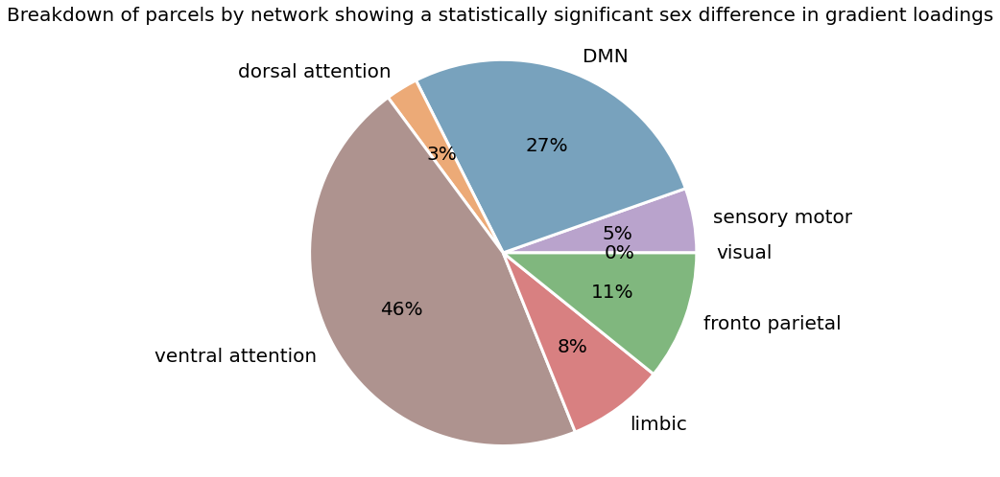

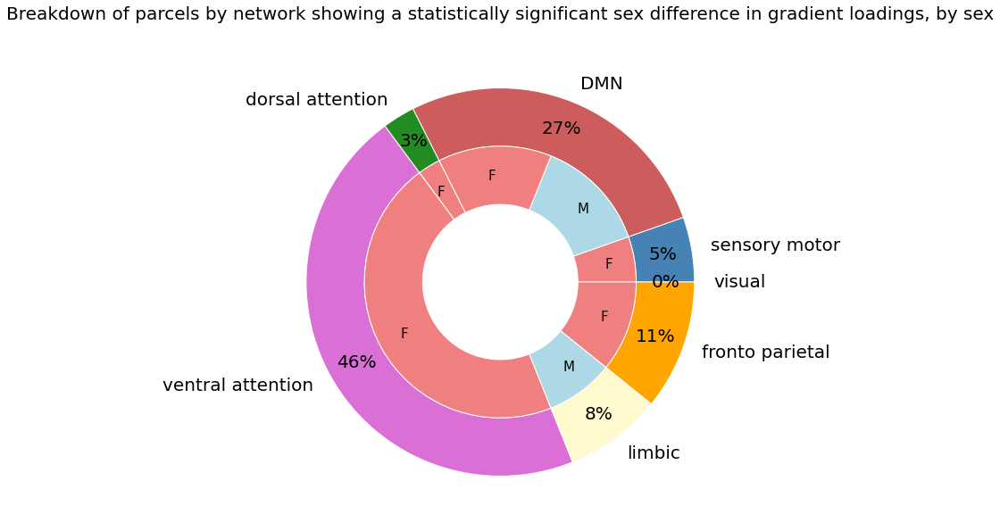

Number of significant parcels by sex:
visual - Male: 0, Female: 0
sensory motor - Male: 0, Female: 2
DMN - Male: 5, Female: 5
dorsal attention - Male: 0, Female: 1
ventral attention - Male: 0, Female: 17
limbic - Male: 3, Female: 0
fronto parietal - Male: 0, Female: 4





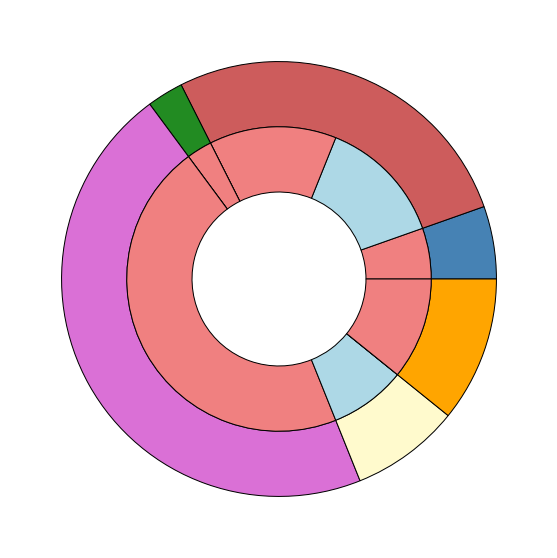




Violin plot of t-values (regression results) by Yeo network


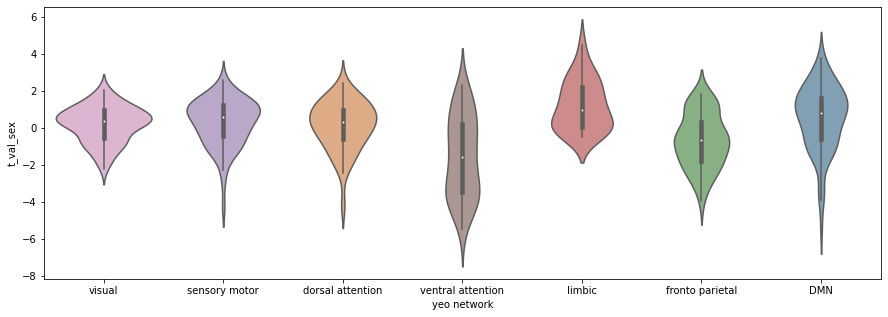

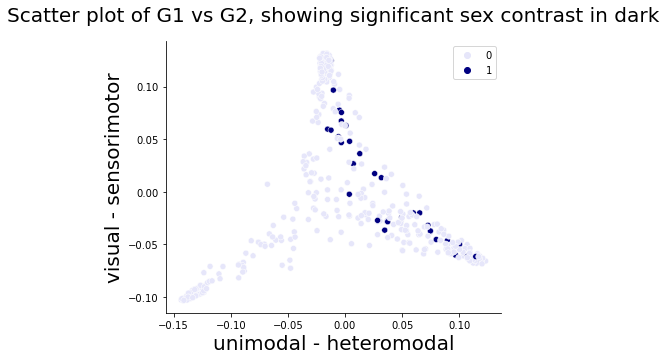

In [91]:
regression_contrast_results_breakdown_by_network(GSP_R_lm_fc_G1_sex_contrast_res, contrast_type = 'sex', 
                                                 scatter_x = GSP_mean_fc_grad_comparable[:,1], scatter_y = GSP_mean_fc_grad_comparable[:,0],
                                                scatter_x_label = 'unimodal - heteromodal',  scatter_y_label = 'visual - sensorimotor')

/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


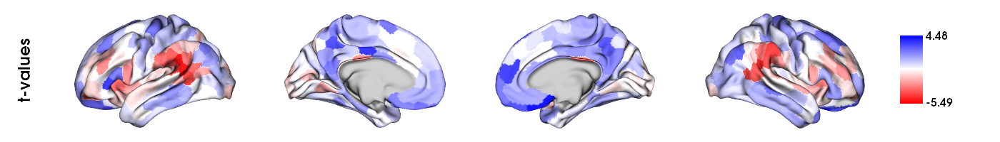

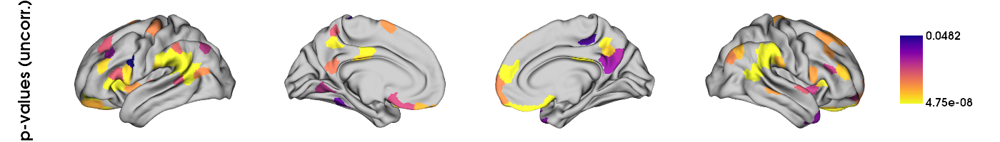

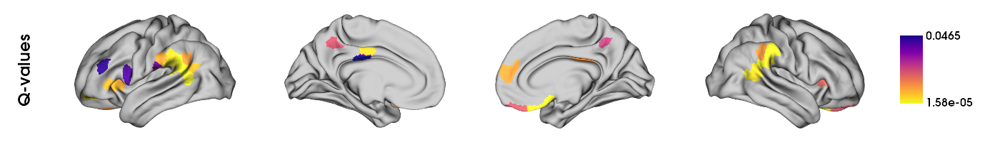

't-values for FDR-corrected q < 0.05: (male: blue, female: red)'

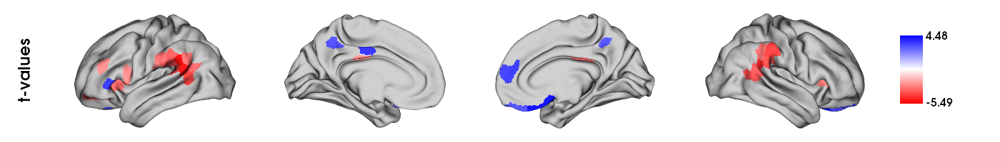

In [111]:
plots_to_display = plot_reg_results_R(GSP_R_lm_fc_G1_sex_contrast_res)
display(*plots_to_display)

### HCP

Number of significant parcels: 28

Number of significant parcels for males: 18
Number of significant parcels for females: 10

Number of significant parcels in each Yeo network (across sexes):
- visual: 3 out of 61 (4.92%) -> 10.71% of overall significance
- sensory motor: 1 out of 77 (1.3%) -> 3.57% of overall significance
- DMN: 11 out of 90 (12.22%) -> 39.29% of overall significance
- dorsal attention: 2 out of 46 (4.35%) -> 7.14% of overall significance
- ventral attention: 7 out of 47 (14.89%) -> 25.0% of overall significance
- limbic: 0 out of 26 (0.0%) -> 0.0% of overall significance
- fronto parietal: 4 out of 53 (7.55%) -> 14.29% of overall significance





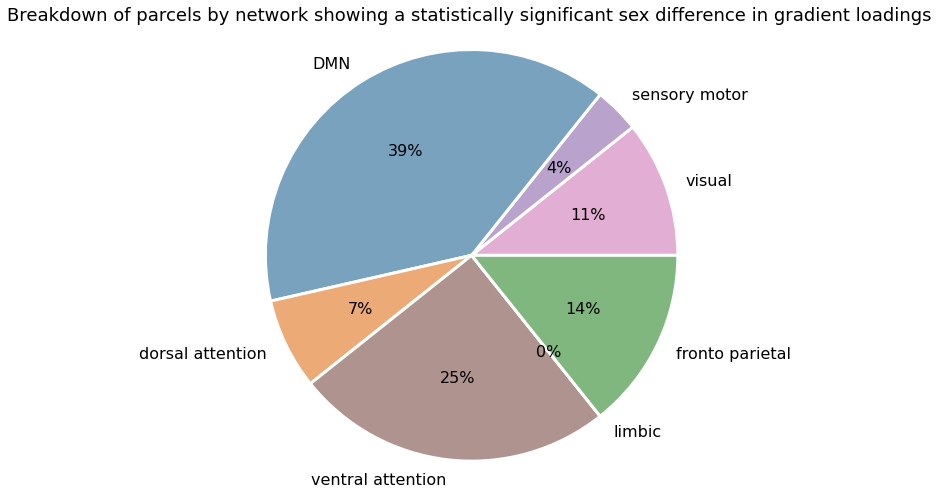

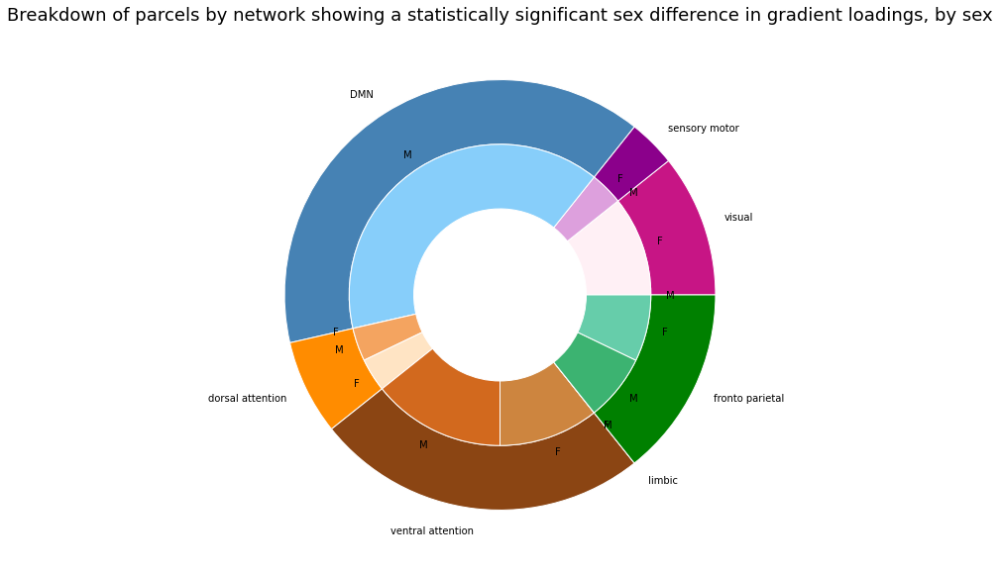

Number of significant parcels by sex:
visual - Male: 0, Female: 3
sensory motor - Male: 0, Female: 1
DMN - Male: 11, Female: 0
dorsal attention - Male: 1, Female: 1
ventral attention - Male: 4, Female: 3
limbic - Male: 0, Female: 0
fronto parietal - Male: 2, Female: 2



Violin plot of t-values (regression results) by Yeo network


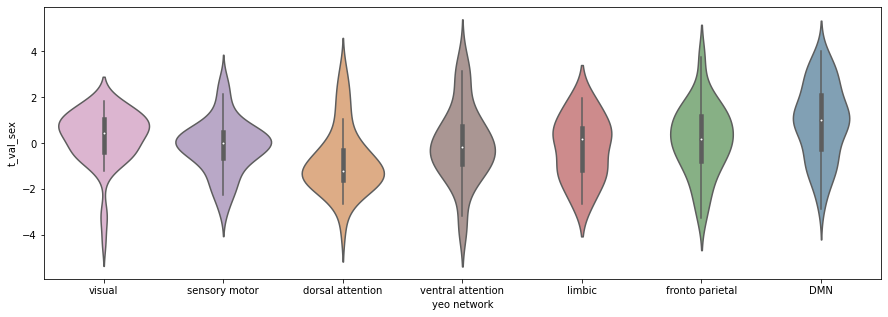

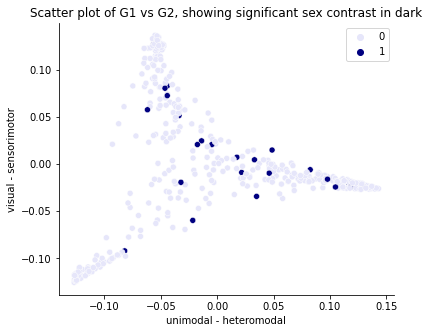

In [112]:
regression_contrast_results_breakdown_by_network(HCP_R_lmer_fc_G2_sex_contrast_res, contrast_type = 'sex', 
                                                 scatter_x = HCP_mean_fc_grad.gradients_[:,0], scatter_y = HCP_mean_fc_grad.gradients_[:,1],
                                                scatter_x_label = 'unimodal - heteromodal',  scatter_y_label = 'visual - sensorimotor')

/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


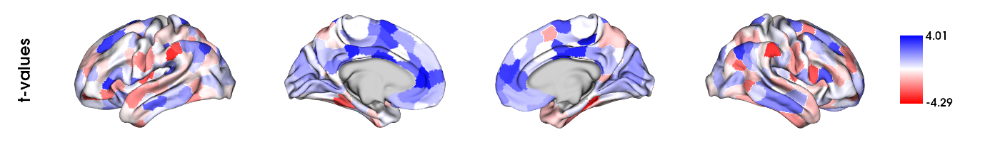

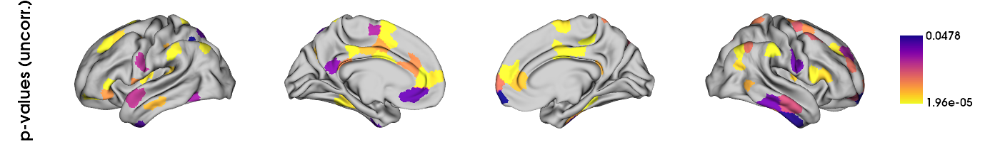

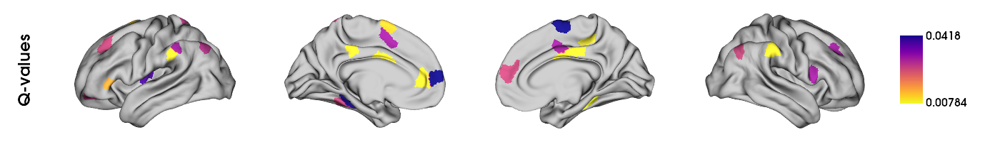

't-values for FDR-corrected q < 0.05: (male: blue, female: red)'

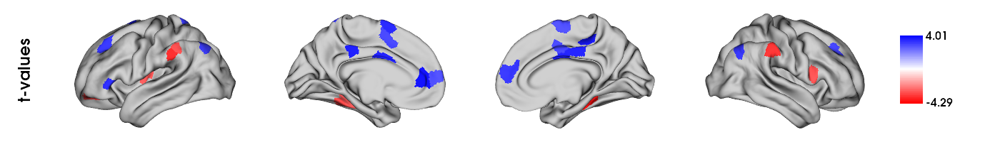

In [113]:
plots_to_display = plot_reg_results_R(HCP_R_lmer_fc_G2_sex_contrast_res)
display(*plots_to_display)

## Gradient 3:  DMN-attention / on vs off task (Sofie)

### GSP

Number of significant parcels: 26

Number of significant parcels for males: 13
Number of significant parcels for females: 13

Number of significant parcels in each Yeo network (across sexes):
- visual: 1 out of 61 (1.64%) -> 3.85% of overall significance
- sensory motor: 2 out of 77 (2.6%) -> 7.69% of overall significance
- DMN: 3 out of 90 (3.33%) -> 11.54% of overall significance
- dorsal attention: 6 out of 46 (13.04%) -> 23.08% of overall significance
- ventral attention: 3 out of 47 (6.38%) -> 11.54% of overall significance
- limbic: 6 out of 26 (23.08%) -> 23.08% of overall significance
- fronto parietal: 5 out of 53 (9.43%) -> 19.23% of overall significance





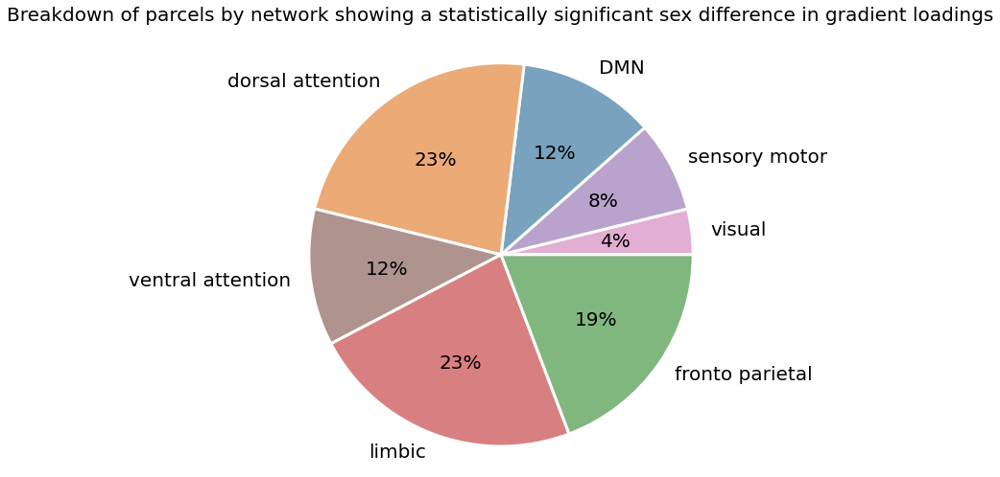

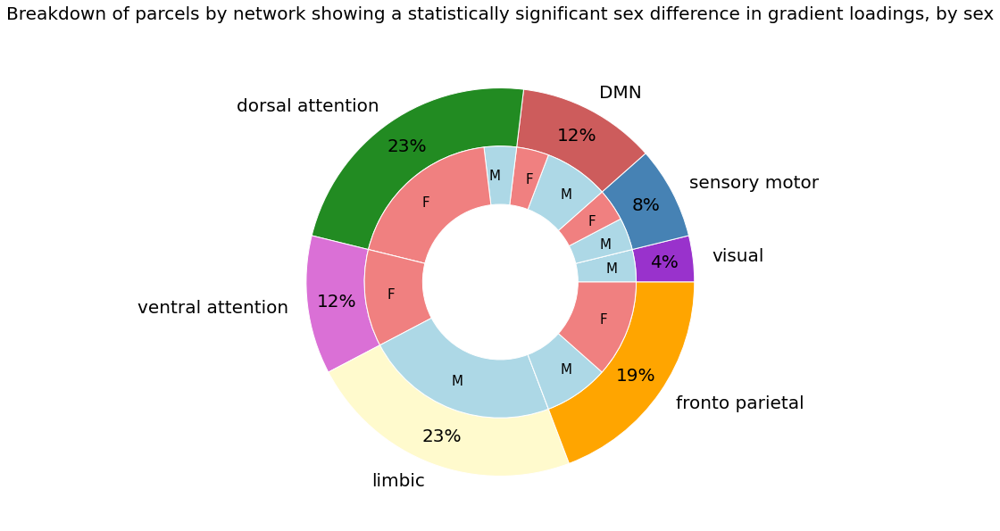

Number of significant parcels by sex:
visual - Male: 1, Female: 0
sensory motor - Male: 1, Female: 1
DMN - Male: 2, Female: 1
dorsal attention - Male: 1, Female: 5
ventral attention - Male: 0, Female: 3
limbic - Male: 6, Female: 0
fronto parietal - Male: 2, Female: 3





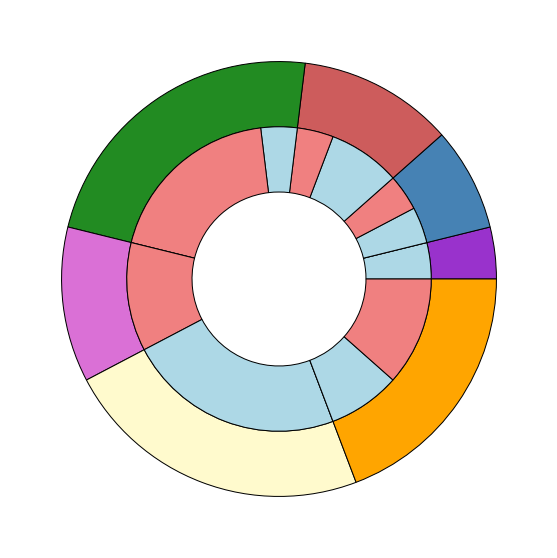




Violin plot of t-values (regression results) by Yeo network


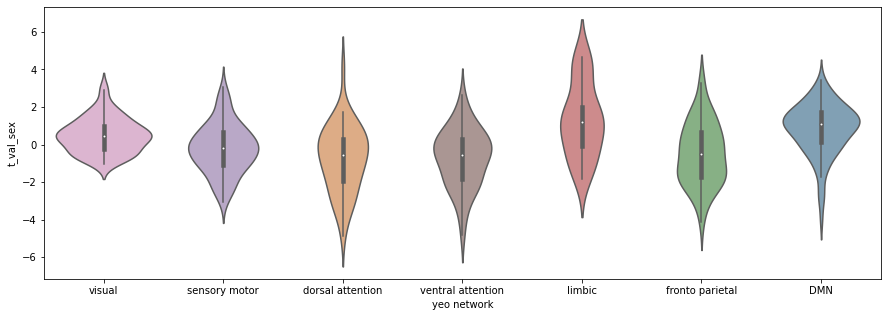

In [92]:
regression_contrast_results_breakdown_by_network(GSP_R_lm_fc_G3_sex_contrast_res, contrast_type = 'sex', scatterplot = False) 
# not displaying scatterplot because labels hardcoded for G1 vs G2 (and it does not make sense to do that for G3 signficance)

/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


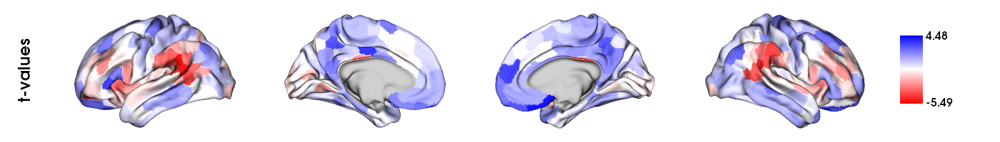

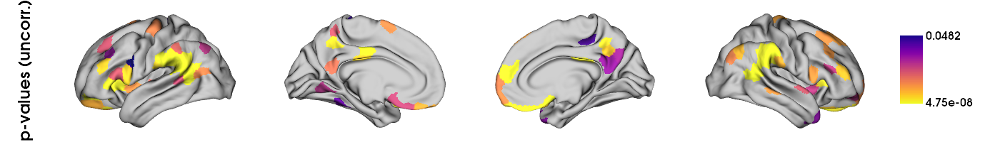

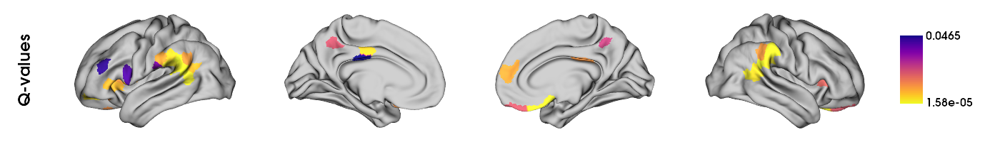

't-values for FDR-corrected q < 0.05: (male: blue, female: red)'

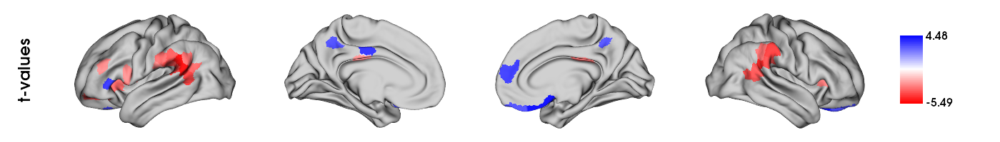

In [115]:
plots_to_display = plot_reg_results_R(GSP_R_lm_fc_G1_sex_contrast_res)
display(*plots_to_display)

### HCP

Number of significant parcels: 51

Number of significant parcels for males: 26
Number of significant parcels for females: 25

Number of significant parcels in each Yeo network (across sexes):
- visual: 2 out of 61 (3.28%) -> 3.92% of overall significance
- sensory motor: 7 out of 77 (9.09%) -> 13.73% of overall significance
- DMN: 12 out of 90 (13.33%) -> 23.53% of overall significance
- dorsal attention: 9 out of 46 (19.57%) -> 17.65% of overall significance
- ventral attention: 10 out of 47 (21.28%) -> 19.61% of overall significance
- limbic: 2 out of 26 (7.69%) -> 3.92% of overall significance
- fronto parietal: 9 out of 53 (16.98%) -> 17.65% of overall significance





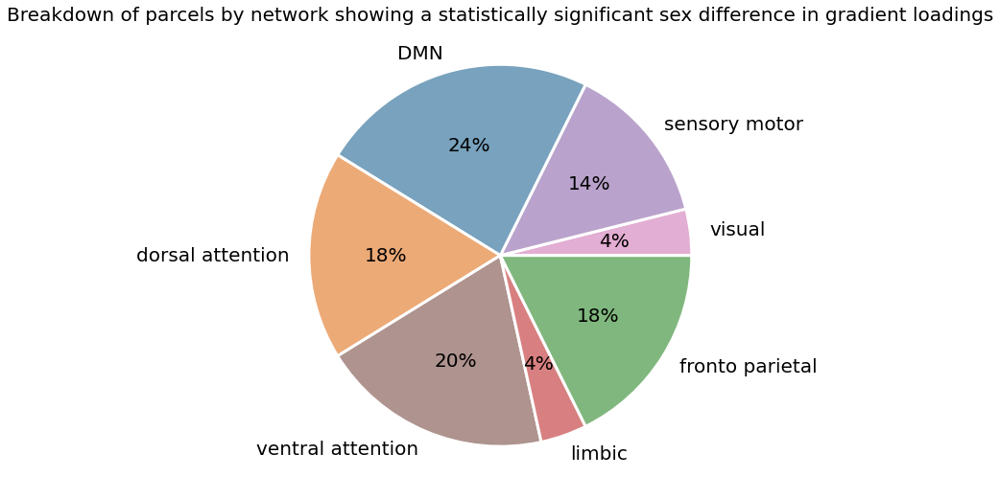

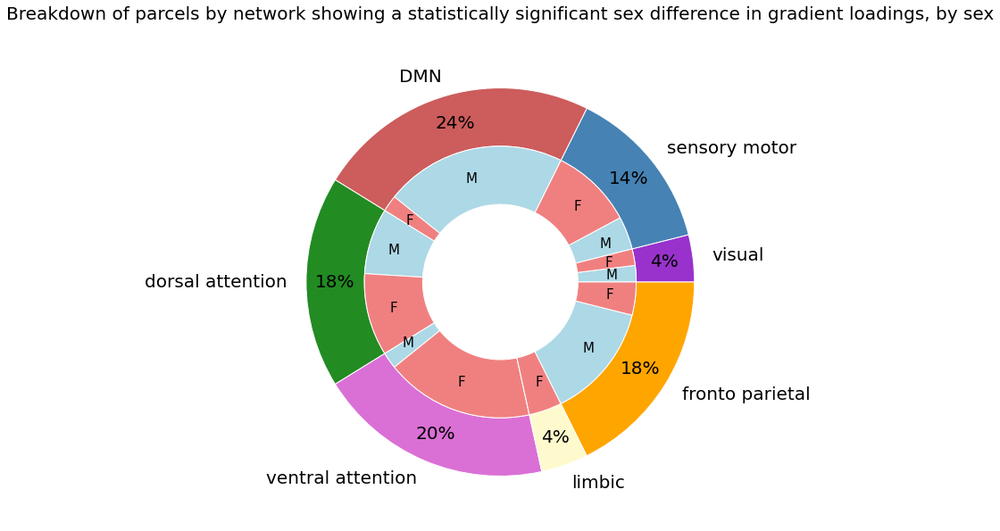

Number of significant parcels by sex:
visual - Male: 1, Female: 1
sensory motor - Male: 2, Female: 5
DMN - Male: 11, Female: 1
dorsal attention - Male: 4, Female: 5
ventral attention - Male: 1, Female: 9
limbic - Male: 0, Female: 2
fronto parietal - Male: 7, Female: 2





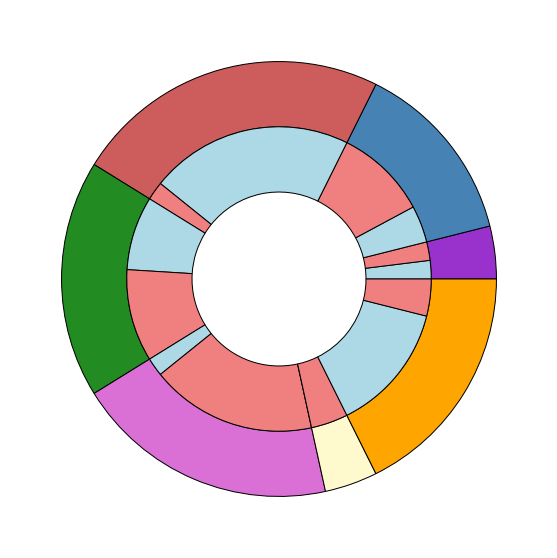




Violin plot of t-values (regression results) by Yeo network


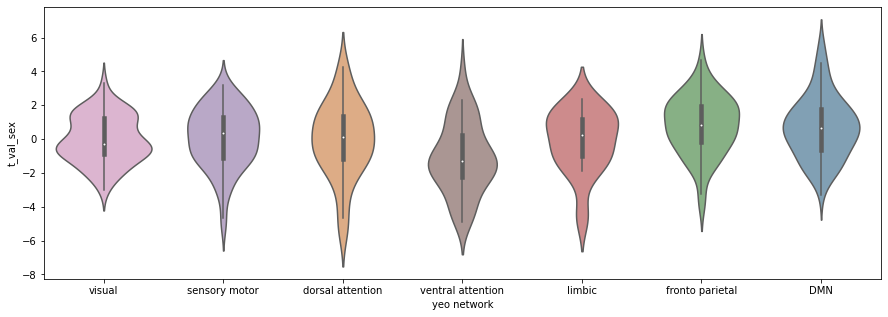

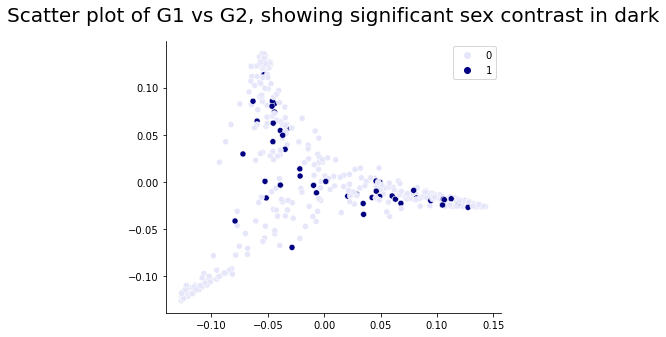

In [93]:
regression_contrast_results_breakdown_by_network(HCP_R_lmer_fc_G3_sex_contrast_res, contrast_type = 'sex', scatter_x = HCP_mean_fc_grad.gradients_[:,0], scatter_y = HCP_mean_fc_grad.gradients_[:,1])

/data/u_serio_software/anaconda3/lib/python3.9/site-packages/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


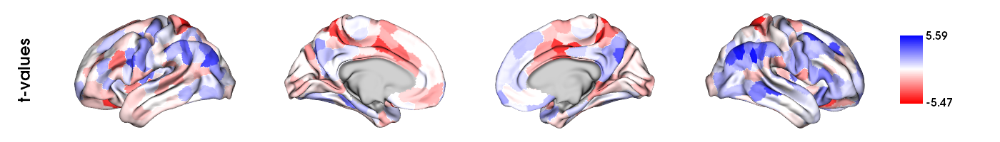

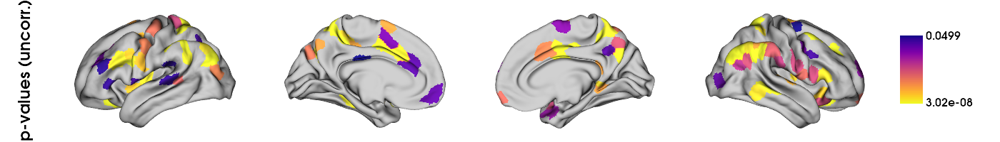

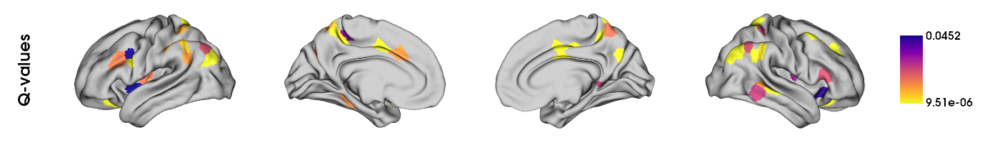

't-values for FDR-corrected q < 0.05: (male: blue, female: red)'

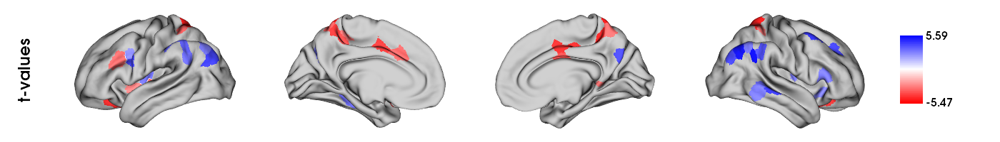

In [117]:
plots_to_display = plot_reg_results_R(HCP_R_lmer_fc_G3_sex_contrast_res)
display(*plots_to_display)

# Comparing functional results between GSP and HCP samples

## Gradients

### Correlation of mean gradients

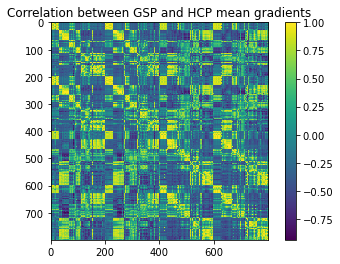

(800, 800)


In [122]:
GSP_HCP_loadings_corr = np.corrcoef(np.array(GSP_mean_fc_grad_comparable), np.array(HCP_mean_fc_grad.gradients_))

# data
fig, ax = plt.subplots()
heatmap = ax.pcolor(GSP_HCP_loadings_corr)
# legend
cbar = plt.colorbar(heatmap)
plt.imshow(np.corrcoef(GSP_HCP_loadings_corr))
plt.title('Correlation between GSP and HCP mean gradients', fontdict=None, loc='center', pad=None)
plt.show()
print(GSP_HCP_loadings_corr.shape)

### Unimodal-Heteromodal gradient

#### Correlation of mean gradient

Overall Pearson correlation between GSP unimodal-heteromodal and HCP unimodal-heteromodal: r = 0.91; p = 0.0

visual: r = 0.87, p = 0.0
sensory motor: r = 0.15, p = 0.196
dorsal attention: r = 0.23, p = 0.125
ventral attention: r = 0.57, p = 0.0
limbic: r = 0.83, p = 0.0
fronto parietal: r = 0.64, p = 0.0
DMN: r = 0.78, p = 0.0




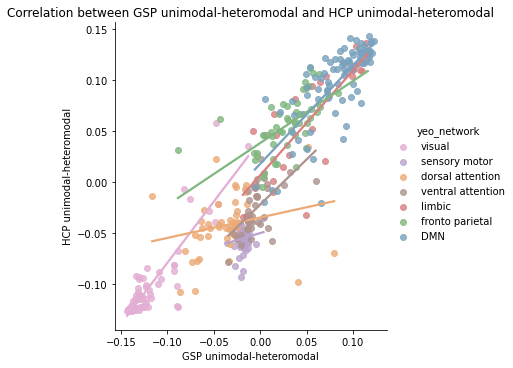

In [123]:
print_plot_corr_networks(x = GSP_mean_fc_grad_comparable[:,1], y = HCP_mean_fc_grad.gradients_[:,0], x_label = 'GSP unimodal-heteromodal', y_label = 'HCP unimodal-heteromodal')

Text(0, 0.5, 'HCP G1')

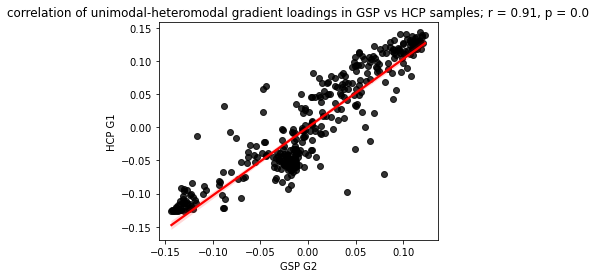

In [124]:
fig, ax = plt.subplots(1, figsize=(5, 4))

sns.regplot(x = GSP_mean_fc_grad_comparable[:,1], y = HCP_mean_fc_grad.gradients_[:,0],
            scatter_kws={"color": "black"}, line_kws={"color": "red"})

temp_corr = stats.pearsonr(GSP_mean_fc_grad_comparable[:,1], HCP_mean_fc_grad.gradients_[:,0])
                    

ax.set_title(f'correlation of unimodal-heteromodal gradient loadings in GSP vs HCP samples; r = {round(temp_corr[0],2)}, p = {round(temp_corr[1],3)}')

ax.set_xlabel('GSP G2')
ax.set_ylabel('HCP G1')


#### Spin permutation test (correlation of gradient loadings)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.001


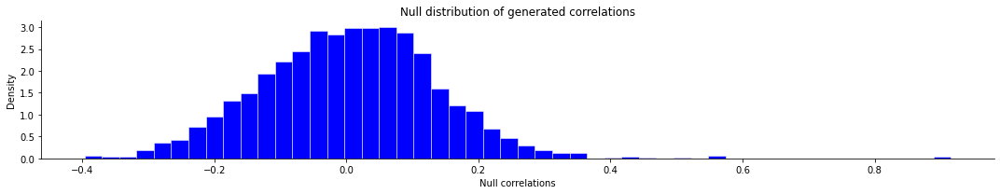

In [125]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = GSP_mean_fc_grad_comparable[:,1], y = HCP_mean_fc_grad.gradients_[:,0])

#### Visualizing gradients by network

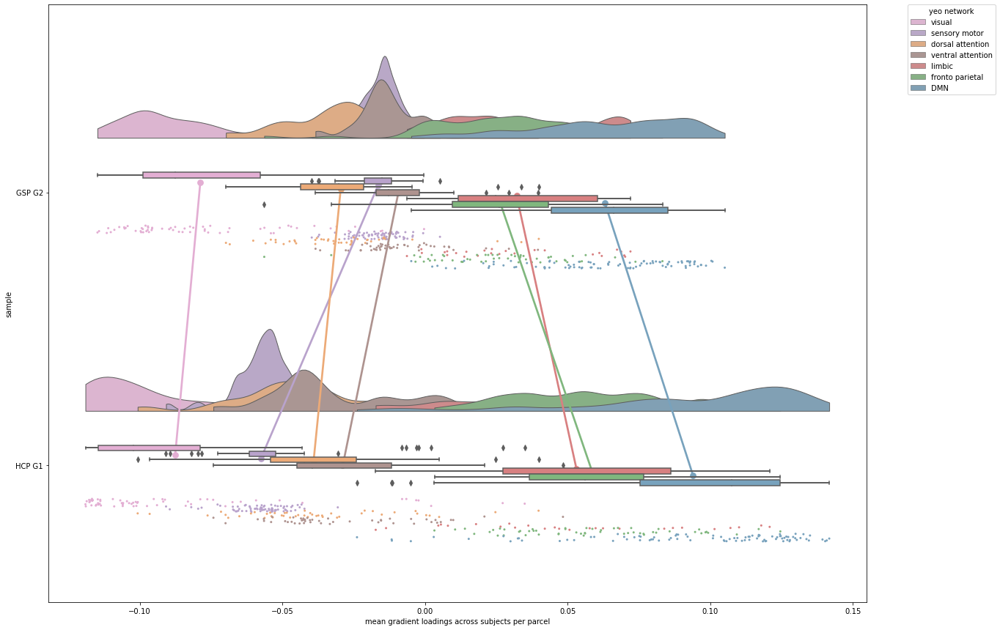

In [126]:
RainCloudPlot_YeoNetworks_SampleComparison_Grad(array_grad_sample_1 = GSP_array_aligned_fc_G2, array_grad_sample_2 = HCP_array_aligned_fc_G1, sample_1_label = "GSP G2", sample_2_label = "HCP G1")

### Visual-Sensorimotor gradient

#### Correlation of mean gradient

Overall Pearson correlation between GSP visual-sensorimotor and HCP visual-sensorimotor: r = 0.91; p = 0.0

visual: r = 0.87, p = 0.0
sensory motor: r = 0.24, p = 0.036
dorsal attention: r = 0.71, p = 0.0
ventral attention: r = 0.8, p = 0.0
limbic: r = 0.41, p = 0.036
fronto parietal: r = 0.52, p = 0.0
DMN: r = 0.93, p = 0.0




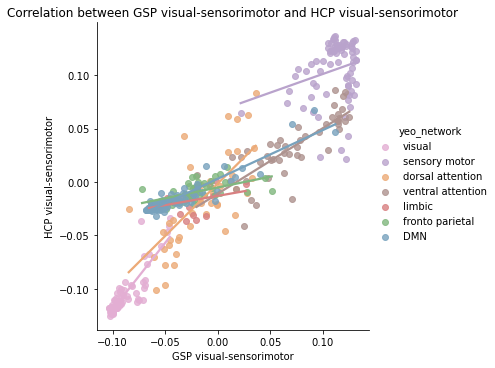

In [127]:
print_plot_corr_networks(x = GSP_mean_fc_grad_comparable[:,0], y = HCP_mean_fc_grad.gradients_[:,1], x_label = 'GSP visual-sensorimotor', y_label = 'HCP visual-sensorimotor')

Text(0, 0.5, 'HCP G2')

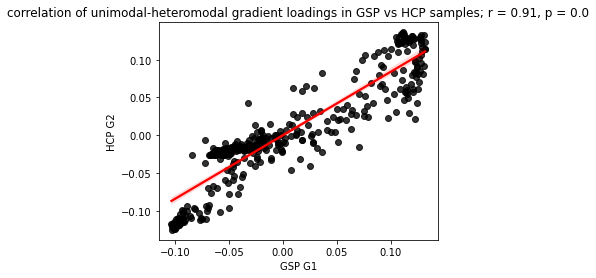

In [128]:
fig, ax = plt.subplots(1, figsize=(5, 4))

sns.regplot(x = GSP_mean_fc_grad_comparable[:,0], y = HCP_mean_fc_grad.gradients_[:,1],
            scatter_kws={"color": "black"}, line_kws={"color": "red"})

temp_corr = stats.pearsonr(GSP_mean_fc_grad_comparable[:,0], HCP_mean_fc_grad.gradients_[:,1])
                    

ax.set_title(f'correlation of unimodal-heteromodal gradient loadings in GSP vs HCP samples; r = {round(temp_corr[0],2)}, p = {round(temp_corr[1],3)}')

ax.set_xlabel('GSP G1')
ax.set_ylabel('HCP G2')


#### Spin permutation test (correlation of gradient loadings)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.003


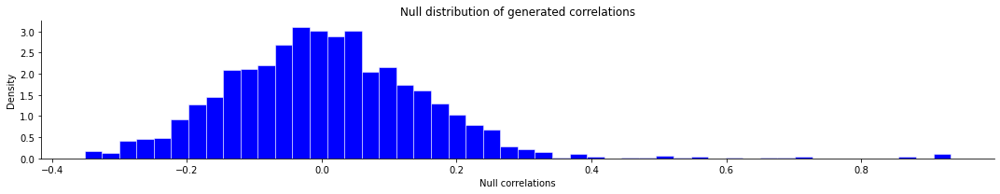

In [129]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = GSP_mean_fc_grad_comparable[:,0], y = HCP_mean_fc_grad.gradients_[:,1])

#### Visualizing gradients by network

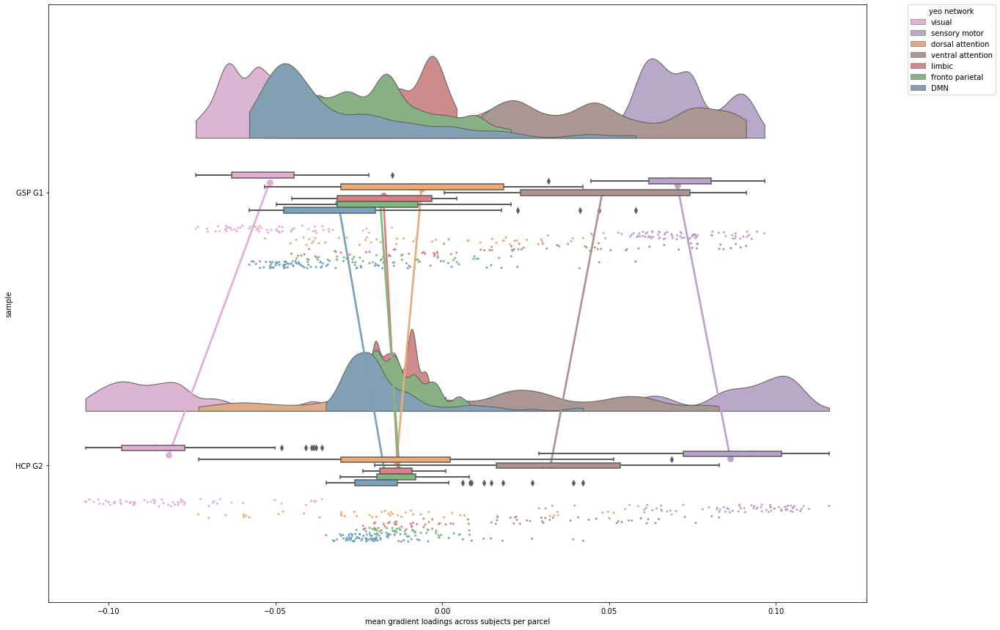

In [130]:
RainCloudPlot_YeoNetworks_SampleComparison_Grad(array_grad_sample_1 = GSP_array_aligned_fc_G1, array_grad_sample_2 = HCP_array_aligned_fc_G2, sample_1_label = "GSP G1", sample_2_label = "HCP G2")

## Sex differences

### Correlation t-values

Overall Pearson correlation between GSP sex contrast G2 t-values and HCP sex contrast G1 t-values: r = 0.56; p = 0.0

visual: r = 0.57, p = 0.0
sensory motor: r = 0.25, p = 0.03
dorsal attention: r = 0.33, p = 0.026
ventral attention: r = 0.33, p = 0.025
limbic: r = 0.4, p = 0.041
fronto parietal: r = 0.38, p = 0.005
DMN: r = 0.49, p = 0.0




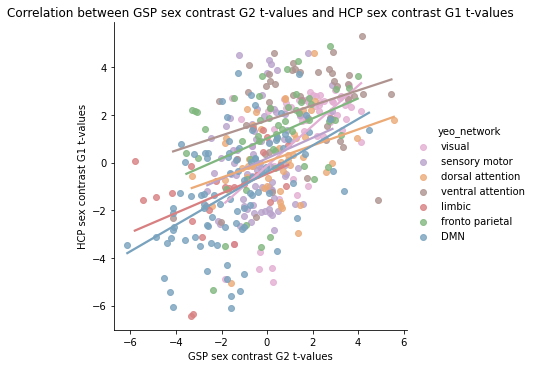

In [109]:
print_plot_corr_networks(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex, x_label = 'GSP sex contrast G2 t-values', y_label = 'HCP sex contrast G1 t-values')

Text(0, 0.5, 'HCP G1')

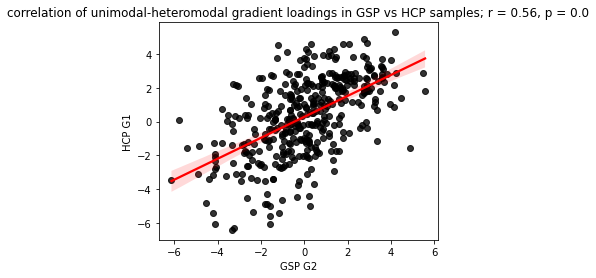

In [132]:
fig, ax = plt.subplots(1, figsize=(5, 4))

sns.regplot(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex,
            scatter_kws={"color": "black"}, line_kws={"color": "red"})

temp_corr = stats.pearsonr(GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex)
                    

ax.set_title(f'correlation of unimodal-heteromodal gradient loadings in GSP vs HCP samples; r = {round(temp_corr[0],2)}, p = {round(temp_corr[1],3)}')

ax.set_xlabel('GSP G2')
ax.set_ylabel('HCP G1')


### Spin permutation test (for correlation of t-values)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.0


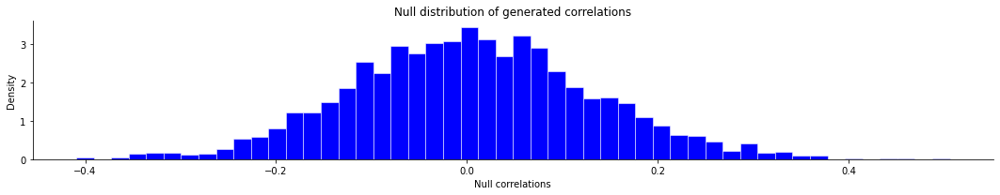

In [133]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex)

### Comparing parcels showing statistically significant sex differences between datasets

In [ ]:
plots_to_display = plot_sig_overlap(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_fc_G1_sex_contrast_res, sample_1_label = "GSP G2", sample_2_label = "HCP G1", save_screenshot = False, modality = 'fc_grad')
display(*plots_to_display)

### Visualizing t-values of sex contrast in unimodal-heteromodal gradient by network

Minimum positive significant t-value in GSP: 2.5
Minimum negative significant t-value in GSP: -2.56

Number of positive significant t-values (M > F (gradient loadings)) in GSP: 56 -> by network: {'visual': 19, 'sensory motor': 2, 'dorsal attention': 4, 'ventral attention': 19, 'limbic': 0, 'fronto parietal': 8, 'DMN': 4}
Number of negative significant t-values (F > M (gradient loadings)) in GSP: 49 -> by network: {'visual': 0, 'sensory motor': 1, 'dorsal attention': 1, 'ventral attention': 1, 'limbic': 11, 'fronto parietal': 6, 'DMN': 29}


Minimum positive significant t-value in HCP: 2.41
Minimum negative significant t-value in HCP: -2.43

Number of positive significant t-values (M > F (gradient loadings)) in HCP: 82 -> by network: {'visual': 23, 'sensory motor': 8, 'dorsal attention': 4, 'ventral attention': 29, 'limbic': 0, 'fronto parietal': 13, 'DMN': 5}
Number of negative significant t-values (F > M (gradient loadings)) in HCP: 52 -> by network: {'visual': 6, 'sensory motor': 5, 

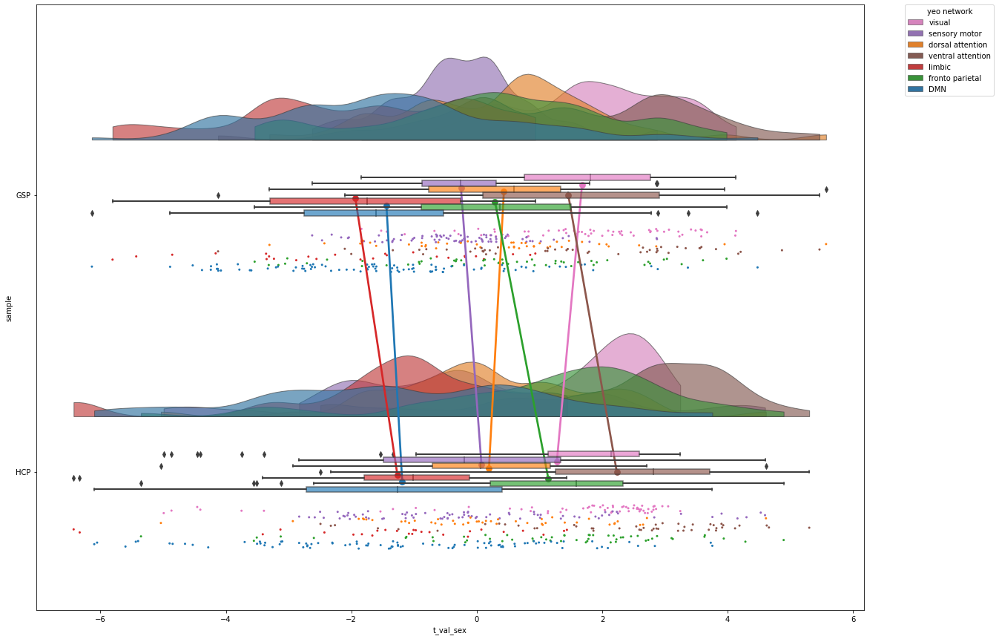

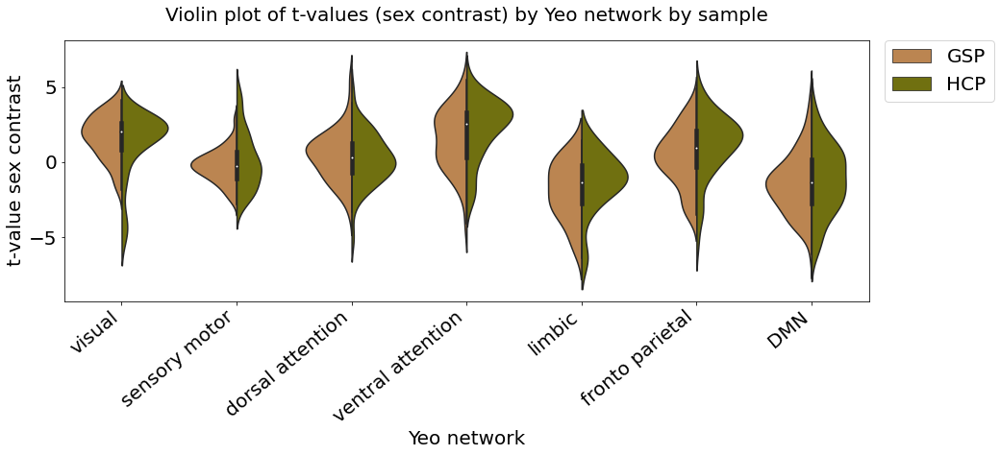

In [56]:
RainCloudPlot_YeoNetworks_SampleComparison_tval(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_fc_G1_sex_contrast_res, sample_1_label = "GSP", sample_2_label = "HCP")